In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 3
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 3
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

3
179
(84, 1972)
(11, 1972)


[I 2025-05-22 01:46:18,267] A new study created in memory with name: no-name-69e785ef-547d-409f-80d0-009fd75bec60
[I 2025-05-22 01:51:04,498] Trial 0 finished with value: 0.0861133724451065 and parameters: {'lr': 0.002993858961855104, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4532712966553972}. Best is trial 0 with value: 0.0861133724451065.


Cross Validation Accuracies:
[0.06773945689201355, 0.06844450533390045, 0.11178705096244812, 0.09995581954717636, 0.08264002948999405]
Mean Cross Validation Accuracy:
0.0861133724451065
Standard Deviation of Cross Validation Accuracy:
0.01739313001972267


[I 2025-05-22 01:58:35,759] Trial 1 finished with value: 0.1660565823316574 and parameters: {'lr': 0.05190702950064668, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1350614128694978}. Best is trial 0 with value: 0.0861133724451065.


Cross Validation Accuracies:
[0.1425952911376953, 0.16870494186878204, 0.14882899820804596, 0.18677236139774323, 0.1833813190460205]
Mean Cross Validation Accuracy:
0.1660565823316574
Standard Deviation of Cross Validation Accuracy:
0.017796211124836384


[I 2025-05-22 02:03:40,281] Trial 2 finished with value: 0.09541470557451248 and parameters: {'lr': 0.1262209880061841, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17286415093882745}. Best is trial 0 with value: 0.0861133724451065.


Cross Validation Accuracies:
[0.06539268046617508, 0.07371846586465836, 0.1330508440732956, 0.12205877900123596, 0.08285275846719742]
Mean Cross Validation Accuracy:
0.09541470557451248
Standard Deviation of Cross Validation Accuracy:
0.02704158610047972


[I 2025-05-22 02:09:35,581] Trial 3 finished with value: 0.08381201103329658 and parameters: {'lr': 0.0036454859331428065, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3022574716873202}. Best is trial 3 with value: 0.08381201103329658.


Cross Validation Accuracies:
[0.06372655183076859, 0.057900283485651016, 0.09966795891523361, 0.11275780946016312, 0.0850074514746666]
Mean Cross Validation Accuracy:
0.08381201103329658
Standard Deviation of Cross Validation Accuracy:
0.020811259949999116


[I 2025-05-22 02:15:41,199] Trial 4 finished with value: 0.08181145563721656 and parameters: {'lr': 0.0036195430336923907, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.465432358551493}. Best is trial 4 with value: 0.08181145563721656.


Cross Validation Accuracies:
[0.06094448268413544, 0.05740765109658241, 0.09566719084978104, 0.11329653114080429, 0.08174142241477966]
Mean Cross Validation Accuracy:
0.08181145563721656
Standard Deviation of Cross Validation Accuracy:
0.02104410852795461


[I 2025-05-22 02:21:05,191] Trial 5 finished with value: 0.08051703199744224 and parameters: {'lr': 0.013288816857693331, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.40243264613259555}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06161819398403168, 0.05925026908516884, 0.09575657546520233, 0.09991634637117386, 0.08604377508163452]
Mean Cross Validation Accuracy:
0.08051703199744224
Standard Deviation of Cross Validation Accuracy:
0.017020947420277557


[I 2025-05-22 02:26:13,231] Trial 6 finished with value: 0.0854543000459671 and parameters: {'lr': 0.0018268382178341974, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.12896081097484668}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.07150575518608093, 0.05792126804590225, 0.10095492005348206, 0.11233994364738464, 0.08454961329698563]
Mean Cross Validation Accuracy:
0.0854543000459671
Standard Deviation of Cross Validation Accuracy:
0.0195783312129428


[I 2025-05-22 02:31:39,373] Trial 7 finished with value: 0.08960656896233558 and parameters: {'lr': 0.002646363946450099, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.40595312689243845}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.071041539311409, 0.059254419058561325, 0.11784174293279648, 0.11210231482982635, 0.08779282867908478]
Mean Cross Validation Accuracy:
0.08960656896233558
Standard Deviation of Cross Validation Accuracy:
0.022682533433516523


[I 2025-05-22 02:36:31,441] Trial 8 finished with value: 0.09422561526298523 and parameters: {'lr': 0.003161744783993952, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3823746192427565}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06492888927459717, 0.06296581774950027, 0.11954294890165329, 0.12616129219532013, 0.09752912819385529]
Mean Cross Validation Accuracy:
0.09422561526298523
Standard Deviation of Cross Validation Accuracy:
0.02648486788943943


[I 2025-05-22 02:40:38,772] Trial 9 finished with value: 0.08351325914263726 and parameters: {'lr': 0.18803118942378674, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4086385021321842}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06847740709781647, 0.05624144896864891, 0.10107613354921341, 0.10499971359968185, 0.08677159249782562]
Mean Cross Validation Accuracy:
0.08351325914263726
Standard Deviation of Cross Validation Accuracy:
0.01871132008004325


[I 2025-05-22 02:50:41,206] Trial 10 finished with value: 0.4850504040718079 and parameters: {'lr': 0.929400945075493, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.301588717765095}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.45283862948417664, 0.47937485575675964, 0.5030181407928467, 0.49342644214630127, 0.4965939521789551]
Mean Cross Validation Accuracy:
0.4850504040718079
Standard Deviation of Cross Validation Accuracy:
0.017866512532471263


[I 2025-05-22 02:56:02,133] Trial 11 finished with value: 0.0821668915450573 and parameters: {'lr': 0.0128791499362605, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4987706277900023}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06413546204566956, 0.05612262710928917, 0.09822496771812439, 0.10389865189790726, 0.08845274895429611]
Mean Cross Validation Accuracy:
0.0821668915450573
Standard Deviation of Cross Validation Accuracy:
0.01883124733826528


[I 2025-05-22 02:59:56,620] Trial 12 finished with value: 0.08645487502217293 and parameters: {'lr': 0.009847091073539184, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3551085874563162}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06681286543607712, 0.059193205088377, 0.12206046283245087, 0.10675173252820969, 0.07745610922574997]
Mean Cross Validation Accuracy:
0.08645487502217293
Standard Deviation of Cross Validation Accuracy:
0.02404040466362477


[I 2025-05-22 03:05:31,922] Trial 13 finished with value: 0.0842771902680397 and parameters: {'lr': 0.012474266014246959, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.48005673129051607}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.07015395164489746, 0.056597232818603516, 0.10188324004411697, 0.10020553320646286, 0.0925459936261177]
Mean Cross Validation Accuracy:
0.0842771902680397
Standard Deviation of Cross Validation Accuracy:
0.01787570485360005


[I 2025-05-22 03:11:08,071] Trial 14 finished with value: 0.08112504929304123 and parameters: {'lr': 0.0011017813679624919, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.21178771690227513}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06298579275608063, 0.054856643080711365, 0.09728901833295822, 0.1119178831577301, 0.07857590913772583]
Mean Cross Validation Accuracy:
0.08112504929304123
Standard Deviation of Cross Validation Accuracy:
0.021142527856066805


[I 2025-05-22 03:18:18,734] Trial 15 finished with value: 2.657641649246216 and parameters: {'lr': 0.034230618449071985, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2096386664238787}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[2.6337380409240723, 2.628714084625244, 2.679671049118042, 2.539536476135254, 2.806548595428467]
Mean Cross Validation Accuracy:
2.657641649246216
Standard Deviation of Cross Validation Accuracy:
0.08719586169231408


[I 2025-05-22 03:27:10,083] Trial 16 finished with value: 0.08722628131508828 and parameters: {'lr': 0.0012129482112105709, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.23047029755202736}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06483273208141327, 0.05637132748961449, 0.10911796241998672, 0.11538856476545334, 0.09042081981897354]
Mean Cross Validation Accuracy:
0.08722628131508828
Standard Deviation of Cross Validation Accuracy:
0.02339258091721914


[I 2025-05-22 03:32:14,356] Trial 17 finished with value: 0.6004385828971863 and parameters: {'lr': 0.00929432855215574, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.27054190018081514}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.6068502068519592, 0.5713677406311035, 0.5563684701919556, 0.6003369092941284, 0.6672695875167847]
Mean Cross Validation Accuracy:
0.6004385828971863
Standard Deviation of Cross Validation Accuracy:
0.03819631171104079


[I 2025-05-22 03:36:37,070] Trial 18 finished with value: 0.09142173081636429 and parameters: {'lr': 0.0010200516316410824, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3474407839209681}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06389065831899643, 0.0698159709572792, 0.11691877990961075, 0.11001814156770706, 0.096465103328228]
Mean Cross Validation Accuracy:
0.09142173081636429
Standard Deviation of Cross Validation Accuracy:
0.021194954227519703


[I 2025-05-22 03:42:39,976] Trial 19 finished with value: 0.07948808893561363 and parameters: {'lr': 0.07192602068891783, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25748605324193313}. Best is trial 19 with value: 0.07948808893561363.


Cross Validation Accuracies:
[0.062321361154317856, 0.05729617178440094, 0.09791482239961624, 0.10294398665428162, 0.07696410268545151]
Mean Cross Validation Accuracy:
0.07948808893561363
Standard Deviation of Cross Validation Accuracy:
0.018348143666847692


[I 2025-05-22 03:47:54,172] Trial 20 finished with value: 0.08200864866375923 and parameters: {'lr': 0.09252621530744096, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2683708817574126}. Best is trial 19 with value: 0.07948808893561363.


Cross Validation Accuracies:
[0.061660584062337875, 0.06444621831178665, 0.09670954197645187, 0.10182573646306992, 0.08540116250514984]
Mean Cross Validation Accuracy:
0.08200864866375923
Standard Deviation of Cross Validation Accuracy:
0.016387953356611015


[I 2025-05-22 03:52:53,248] Trial 21 finished with value: 0.08059802129864693 and parameters: {'lr': 0.28046827387395024, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.20711743535881616}. Best is trial 19 with value: 0.07948808893561363.


Cross Validation Accuracies:
[0.07011864334344864, 0.053711485117673874, 0.09212350845336914, 0.10520089417695999, 0.08183557540178299]
Mean Cross Validation Accuracy:
0.08059802129864693
Standard Deviation of Cross Validation Accuracy:
0.017733431356153028


[I 2025-05-22 03:58:02,210] Trial 22 finished with value: 0.09381262734532356 and parameters: {'lr': 0.3712790150417578, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.1701122042103024}. Best is trial 19 with value: 0.07948808893561363.


Cross Validation Accuracies:
[0.060206782072782516, 0.07798883318901062, 0.10161657631397247, 0.12406999617815018, 0.10518094897270203]
Mean Cross Validation Accuracy:
0.09381262734532356
Standard Deviation of Cross Validation Accuracy:
0.02229526417335232


[I 2025-05-22 04:03:25,519] Trial 23 finished with value: 0.0775798887014389 and parameters: {'lr': 0.3869852350611926, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25154256825896665}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06611460447311401, 0.06344830244779587, 0.08096839487552643, 0.09910352528095245, 0.07826461642980576]
Mean Cross Validation Accuracy:
0.0775798887014389
Standard Deviation of Cross Validation Accuracy:
0.012699387624930784


[I 2025-05-22 04:09:12,247] Trial 24 finished with value: 13.715311050415039 and parameters: {'lr': 0.7905857726059043, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.26753090937484414}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[10.1988525390625, 9.065418243408203, 19.908554077148438, 15.049149513244629, 14.354580879211426]
Mean Cross Validation Accuracy:
13.715311050415039
Standard Deviation of Cross Validation Accuracy:
3.8608557011582927


[I 2025-05-22 04:17:34,083] Trial 25 finished with value: 1.543600869178772 and parameters: {'lr': 0.022901936986128003, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.32717510122563964}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[1.4165431261062622, 1.6115736961364746, 1.6354900598526, 1.4223712682724, 1.632026195526123]
Mean Cross Validation Accuracy:
1.543600869178772
Standard Deviation of Cross Validation Accuracy:
0.10170865559778737


[I 2025-05-22 04:23:12,582] Trial 26 finished with value: 0.0892090491950512 and parameters: {'lr': 0.06844934952212027, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25340395835537777}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06366133689880371, 0.05729943886399269, 0.10367091000080109, 0.10568571090698242, 0.11572784930467606]
Mean Cross Validation Accuracy:
0.0892090491950512
Standard Deviation of Cross Validation Accuracy:
0.023894691433204888


[I 2025-05-22 04:28:55,418] Trial 27 finished with value: 0.08141842186450958 and parameters: {'lr': 0.40248464111718907, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.32768943994685745}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06213415786623955, 0.06130155548453331, 0.09810497611761093, 0.09553691744804382, 0.0900145024061203]
Mean Cross Validation Accuracy:
0.08141842186450958
Standard Deviation of Cross Validation Accuracy:
0.01629869173870481


[I 2025-05-22 04:36:06,554] Trial 28 finished with value: 0.1940023347735405 and parameters: {'lr': 0.03773522484741575, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4314079167732767}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.17648378014564514, 0.21369968354701996, 0.10760920494794846, 0.30427518486976624, 0.1679438203573227]
Mean Cross Validation Accuracy:
0.1940023347735405
Standard Deviation of Cross Validation Accuracy:
0.06480402121464554


[I 2025-05-22 04:40:54,797] Trial 29 finished with value: 0.08355658203363418 and parameters: {'lr': 0.018192682950179784, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16988620889718117}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06635057181119919, 0.06327784806489944, 0.10090164840221405, 0.09818447381258011, 0.08906836807727814]
Mean Cross Validation Accuracy:
0.08355658203363418
Standard Deviation of Cross Validation Accuracy:
0.015827066498673444


[I 2025-05-22 04:46:51,359] Trial 30 finished with value: 0.09254877716302871 and parameters: {'lr': 0.006851873150548712, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.3741160105275711}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06548438966274261, 0.08282216638326645, 0.10463199764490128, 0.1236889436841011, 0.08611638844013214]
Mean Cross Validation Accuracy:
0.09254877716302871
Standard Deviation of Cross Validation Accuracy:
0.01992073211949169


[I 2025-05-22 04:51:47,448] Trial 31 finished with value: 0.08393142595887185 and parameters: {'lr': 0.24333876253981998, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.22775173556953823}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06338895857334137, 0.059947554022073746, 0.11315419524908066, 0.09917917847633362, 0.08398724347352982]
Mean Cross Validation Accuracy:
0.08393142595887185
Standard Deviation of Cross Validation Accuracy:
0.02041414410051908


[I 2025-05-22 04:56:19,927] Trial 32 finished with value: 2.5614133194088935 and parameters: {'lr': 0.5823056743814229, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.18981956248305115}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.08879417181015015, 0.07141074538230896, 0.10707855969667435, 0.10128462314605713, 12.438498497009277]
Mean Cross Validation Accuracy:
2.5614133194088935
Standard Deviation of Cross Validation Accuracy:
4.93855772849142


[I 2025-05-22 05:01:37,520] Trial 33 finished with value: 0.08830386996269227 and parameters: {'lr': 0.14986849201261085, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.11283013270828512}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.08245066553354263, 0.06833384931087494, 0.09643177688121796, 0.11370282620191574, 0.08060023188591003]
Mean Cross Validation Accuracy:
0.08830386996269227
Standard Deviation of Cross Validation Accuracy:
0.015515009606569269


[I 2025-05-22 05:06:16,641] Trial 34 finished with value: 0.08693940937519073 and parameters: {'lr': 0.2895977139698911, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2935307506703227}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.0630667433142662, 0.07759315520524979, 0.09025144577026367, 0.1255364567041397, 0.0782492458820343]
Mean Cross Validation Accuracy:
0.08693940937519073
Standard Deviation of Cross Validation Accuracy:
0.021135170881725847


[I 2025-05-22 05:09:51,300] Trial 35 finished with value: 0.16437515318393708 and parameters: {'lr': 0.057598527896793185, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2455947852195416}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.1654883623123169, 0.143480122089386, 0.1843797117471695, 0.16155435144901276, 0.16697321832180023]
Mean Cross Validation Accuracy:
0.16437515318393708
Standard Deviation of Cross Validation Accuracy:
0.013059332197351383


[I 2025-05-22 05:15:00,741] Trial 36 finished with value: 0.09519536644220353 and parameters: {'lr': 0.10852426265030085, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.14958507978642271}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06798748672008514, 0.08564537018537521, 0.1072949692606926, 0.13470008969306946, 0.0803489163517952]
Mean Cross Validation Accuracy:
0.09519536644220353
Standard Deviation of Cross Validation Accuracy:
0.023490048000199475


[I 2025-05-22 05:19:00,909] Trial 37 finished with value: 0.09796306192874908 and parameters: {'lr': 0.4912838258921187, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2969670781373659}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.066108837723732, 0.06127481162548065, 0.13775014877319336, 0.10179128497838974, 0.12289022654294968]
Mean Cross Validation Accuracy:
0.09796306192874908
Standard Deviation of Cross Validation Accuracy:
0.030264667244188817


[I 2025-05-22 05:25:14,311] Trial 38 finished with value: 0.08321709111332894 and parameters: {'lr': 0.005831023701280837, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.19683877516998946}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.061585452407598495, 0.05584099143743515, 0.10236756503582001, 0.11079087853431702, 0.085500568151474]
Mean Cross Validation Accuracy:
0.08321709111332894
Standard Deviation of Cross Validation Accuracy:
0.02167785643525353


[I 2025-05-22 05:30:46,411] Trial 39 finished with value: 2.3789990901947022 and parameters: {'lr': 0.20748034847908847, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.23592635118324057}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[1.5981230735778809, 4.236791610717773, 1.1380805969238281, 2.682857036590576, 2.239143133163452]
Mean Cross Validation Accuracy:
2.3789990901947022
Standard Deviation of Cross Validation Accuracy:
1.06891799965063


[I 2025-05-22 05:35:56,137] Trial 40 finished with value: 3.367971324920654 and parameters: {'lr': 0.13906057333239125, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.31964575024189024}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[3.607982873916626, 2.995022773742676, 5.666391849517822, 2.4467501640319824, 2.123708963394165]
Mean Cross Validation Accuracy:
3.367971324920654
Standard Deviation of Cross Validation Accuracy:
1.255091257634063


[I 2025-05-22 05:40:37,079] Trial 41 finished with value: 0.08105831518769264 and parameters: {'lr': 0.0019455803018854183, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.21395749439441242}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06082657724618912, 0.055708203464746475, 0.09688141942024231, 0.10943669825792313, 0.08243867754936218]
Mean Cross Validation Accuracy:
0.08105831518769264
Standard Deviation of Cross Validation Accuracy:
0.020540496770934804


[I 2025-05-22 05:44:09,490] Trial 42 finished with value: 0.08902105689048767 and parameters: {'lr': 0.08164960816223014, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.28038610643316164}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.0715346708893776, 0.07618313282728195, 0.10144156962633133, 0.11802299320697784, 0.07792291790246964]
Mean Cross Validation Accuracy:
0.08902105689048767
Standard Deviation of Cross Validation Accuracy:
0.01782770947349562


[I 2025-05-22 05:48:02,548] Trial 43 finished with value: 0.0793338194489479 and parameters: {'lr': 0.0021484773870575026, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2102428155118325}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.060706619173288345, 0.057413939386606216, 0.09402504563331604, 0.10603396594524384, 0.0784895271062851]
Mean Cross Validation Accuracy:
0.0793338194489479
Standard Deviation of Cross Validation Accuracy:
0.018745114090561215


[I 2025-05-22 05:52:00,649] Trial 44 finished with value: 0.10144739598035812 and parameters: {'lr': 0.6350305898594952, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.14856181472361712}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.1033075749874115, 0.07993540167808533, 0.10092855244874954, 0.11212355643510818, 0.11094189435243607]
Mean Cross Validation Accuracy:
0.10144739598035812
Standard Deviation of Cross Validation Accuracy:
0.011581202569703642


[I 2025-05-22 05:55:46,823] Trial 45 finished with value: 0.08309093937277794 and parameters: {'lr': 0.004619335450345455, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.18931545478336997}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06306439638137817, 0.05668722465634346, 0.10677657276391983, 0.11056521534919739, 0.07836128771305084]
Mean Cross Validation Accuracy:
0.08309093937277794
Standard Deviation of Cross Validation Accuracy:
0.022074570208290064


[I 2025-05-22 05:59:05,786] Trial 46 finished with value: 0.08491324186325074 and parameters: {'lr': 0.018294193007941342, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.24944211633274574}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06978172063827515, 0.057913027703762054, 0.10513082146644592, 0.10740230232477188, 0.08433833718299866]
Mean Cross Validation Accuracy:
0.08491324186325074
Standard Deviation of Cross Validation Accuracy:
0.019353621780354206


[I 2025-05-22 06:03:24,214] Trial 47 finished with value: 3.814329814910889 and parameters: {'lr': 0.04912912993897178, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.41691164935501507}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[3.173708200454712, 3.4651377201080322, 4.416841506958008, 3.4523329734802246, 4.563628673553467]
Mean Cross Validation Accuracy:
3.814329814910889
Standard Deviation of Cross Validation Accuracy:
0.5635320760708437


[I 2025-05-22 06:10:47,542] Trial 48 finished with value: 0.07752783372998237 and parameters: {'lr': 0.30861173110805173, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.44613235732750156}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06516171991825104, 0.05991170182824135, 0.08209428936243057, 0.0976945087313652, 0.08277694880962372]
Mean Cross Validation Accuracy:
0.07752783372998237
Standard Deviation of Cross Validation Accuracy:
0.013552485976809314


[I 2025-05-22 06:14:42,367] Trial 49 finished with value: 0.08484199568629265 and parameters: {'lr': 0.17108960983227445, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.462851688554278}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07144562155008316, 0.05646758899092674, 0.08744262903928757, 0.11905836313962936, 0.08979577571153641]
Mean Cross Validation Accuracy:
0.08484199568629265
Standard Deviation of Cross Validation Accuracy:
0.02091235437433242


[I 2025-05-22 06:20:16,722] Trial 50 finished with value: 0.08974734544754029 and parameters: {'lr': 0.002327288607354474, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.43263272843659084}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.0818994790315628, 0.053746625781059265, 0.09930725395679474, 0.11583039909601212, 0.09795296937227249]
Mean Cross Validation Accuracy:
0.08974734544754029
Standard Deviation of Cross Validation Accuracy:
0.02096039420486215


[I 2025-05-22 06:26:21,968] Trial 51 finished with value: 0.09597393423318863 and parameters: {'lr': 0.29385813126376736, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.49592615918301597}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06596385687589645, 0.09019596129655838, 0.1030174046754837, 0.12140204757452011, 0.0992904007434845]
Mean Cross Validation Accuracy:
0.09597393423318863
Standard Deviation of Cross Validation Accuracy:
0.018117329208976088


[I 2025-05-22 06:31:43,762] Trial 52 finished with value: 0.08253932446241379 and parameters: {'lr': 0.3565649953393696, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4432301292169488}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06488393247127533, 0.06840753555297852, 0.09611684828996658, 0.1062009409070015, 0.07708736509084702]
Mean Cross Validation Accuracy:
0.08253932446241379
Standard Deviation of Cross Validation Accuracy:
0.016033498876972273


[I 2025-05-22 06:38:32,700] Trial 53 finished with value: 0.08725608587265014 and parameters: {'lr': 0.9106523322441608, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.39043139622776407}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06438033282756805, 0.0642552450299263, 0.10705126076936722, 0.11122798174619675, 0.08936560899019241]
Mean Cross Validation Accuracy:
0.08725608587265014
Standard Deviation of Cross Validation Accuracy:
0.020116110884557777


[I 2025-05-22 06:46:33,318] Trial 54 finished with value: 0.10734422504901886 and parameters: {'lr': 0.0014729876839558508, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.22071898846567448}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.11414071917533875, 0.05873413383960724, 0.10907444357872009, 0.1302301585674286, 0.12454167008399963]
Mean Cross Validation Accuracy:
0.10734422504901886
Standard Deviation of Cross Validation Accuracy:
0.0254230014935184


[I 2025-05-22 06:50:56,950] Trial 55 finished with value: 0.08744491785764694 and parameters: {'lr': 0.02631358488600704, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2596380723760131}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07139096409082413, 0.06322024762630463, 0.0991266518831253, 0.1225060299038887, 0.08098069578409195]
Mean Cross Validation Accuracy:
0.08744491785764694
Standard Deviation of Cross Validation Accuracy:
0.021223075809796942


[I 2025-05-22 06:56:41,215] Trial 56 finished with value: 0.08800698146224022 and parameters: {'lr': 0.22653605953988898, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.19899856527779133}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.061264339834451675, 0.0642021968960762, 0.12150481343269348, 0.11154525727033615, 0.08151829987764359]
Mean Cross Validation Accuracy:
0.08800698146224022
Standard Deviation of Cross Validation Accuracy:
0.024495284496893713


[I 2025-05-22 07:05:16,645] Trial 57 finished with value: 48.8194938659668 and parameters: {'lr': 0.5027501473726137, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4769756911611829}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[46.786376953125, 40.68730163574219, 38.449851989746094, 70.90129852294922, 47.272640228271484]
Mean Cross Validation Accuracy:
48.8194938659668
Standard Deviation of Cross Validation Accuracy:
11.556768065313594


[I 2025-05-22 07:09:53,192] Trial 58 finished with value: 0.08630121052265168 and parameters: {'lr': 0.12229381194015032, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.28649950485818404}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07040943950414658, 0.06395819783210754, 0.11248704791069031, 0.09691894054412842, 0.08773242682218552]
Mean Cross Validation Accuracy:
0.08630121052265168
Standard Deviation of Cross Validation Accuracy:
0.017619541723962268


[I 2025-05-22 07:14:25,423] Trial 59 finished with value: 0.08040249571204186 and parameters: {'lr': 0.03817057617006594, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.31352944110103065}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06115017086267471, 0.05848640576004982, 0.09296417981386185, 0.10837450623512268, 0.08103721588850021]
Mean Cross Validation Accuracy:
0.08040249571204186
Standard Deviation of Cross Validation Accuracy:
0.018929337868869217


[I 2025-05-22 07:18:20,115] Trial 60 finished with value: 0.08142709583044053 and parameters: {'lr': 0.04317742502561658, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3586447212204432}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.0604102723300457, 0.05833691731095314, 0.09944935142993927, 0.10374533385038376, 0.08519360423088074]
Mean Cross Validation Accuracy:
0.08142709583044053
Standard Deviation of Cross Validation Accuracy:
0.01903657135540765


[I 2025-05-22 07:22:50,692] Trial 61 finished with value: 0.08212285935878753 and parameters: {'lr': 0.03115223482271194, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3127921030600804}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06276403367519379, 0.05864008516073227, 0.0958230197429657, 0.10997454822063446, 0.08341260999441147]
Mean Cross Validation Accuracy:
0.08212285935878753
Standard Deviation of Cross Validation Accuracy:
0.019448800680741445


[I 2025-05-22 07:27:03,433] Trial 62 finished with value: 0.08848918452858925 and parameters: {'lr': 0.012677750139624196, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3989286879641382}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06087751314043999, 0.0645705908536911, 0.09193670004606247, 0.13851594924926758, 0.08654516935348511]
Mean Cross Validation Accuracy:
0.08848918452858925
Standard Deviation of Cross Validation Accuracy:
0.027759125587432966


[I 2025-05-22 07:30:52,800] Trial 63 finished with value: 0.08048676922917367 and parameters: {'lr': 0.06912795919175418, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3456031105252862}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06332097947597504, 0.05824962630867958, 0.08922441303730011, 0.10835466533899307, 0.0832841619849205]
Mean Cross Validation Accuracy:
0.08048676922917367
Standard Deviation of Cross Validation Accuracy:
0.01816560663590832


[I 2025-05-22 07:34:33,117] Trial 64 finished with value: 0.08092587366700173 and parameters: {'lr': 0.06801476398684621, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.33708934705746063}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06336896866559982, 0.05631506070494652, 0.09811475872993469, 0.10525738447904587, 0.08157319575548172]
Mean Cross Validation Accuracy:
0.08092587366700173
Standard Deviation of Cross Validation Accuracy:
0.01898334133850567


[I 2025-05-22 07:39:14,337] Trial 65 finished with value: 0.08166715651750564 and parameters: {'lr': 0.10178029852501957, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3738088757506533}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06312628090381622, 0.053757622838020325, 0.09814562648534775, 0.10680827498435974, 0.08649797737598419]
Mean Cross Validation Accuracy:
0.08166715651750564
Standard Deviation of Cross Validation Accuracy:
0.020246771491478865


[I 2025-05-22 07:44:12,612] Trial 66 finished with value: 0.1001182496547699 and parameters: {'lr': 0.009516872651496026, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.30891092718543833}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.09932751208543777, 0.06559263914823532, 0.1030639111995697, 0.10369420051574707, 0.12891298532485962]
Mean Cross Validation Accuracy:
0.1001182496547699
Standard Deviation of Cross Validation Accuracy:
0.020215064657623318


[I 2025-05-22 07:49:06,717] Trial 67 finished with value: 0.0838048093020916 and parameters: {'lr': 0.020676414860656727, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4164000971371864}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06344303488731384, 0.05542108044028282, 0.1007085070014, 0.1156153455376625, 0.08383607864379883]
Mean Cross Validation Accuracy:
0.0838048093020916
Standard Deviation of Cross Validation Accuracy:
0.022440517421373686


[I 2025-05-22 07:54:19,570] Trial 68 finished with value: 0.0830414928495884 and parameters: {'lr': 0.015977052037832153, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3593081900038437}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06785398721694946, 0.05781260505318642, 0.09497270733118057, 0.11173783987760544, 0.08283032476902008]
Mean Cross Validation Accuracy:
0.0830414928495884
Standard Deviation of Cross Validation Accuracy:
0.019146988852042864


[I 2025-05-22 07:58:59,794] Trial 69 finished with value: 0.10127677917480468 and parameters: {'lr': 0.0033391803915875725, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2793372143052008}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.10321890562772751, 0.08251064270734787, 0.08516857028007507, 0.12305684387683868, 0.1124289333820343]
Mean Cross Validation Accuracy:
0.10127677917480468
Standard Deviation of Cross Validation Accuracy:
0.015583041351143351


[I 2025-05-22 08:03:00,759] Trial 70 finished with value: 0.08165766298770905 and parameters: {'lr': 0.06328267860833357, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3373932867907494}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06180744245648384, 0.05710085853934288, 0.09624502062797546, 0.10984611511230469, 0.08328887820243835]
Mean Cross Validation Accuracy:
0.08165766298770905
Standard Deviation of Cross Validation Accuracy:
0.020035511468569973


[I 2025-05-22 08:09:05,902] Trial 71 finished with value: 0.08854031711816787 and parameters: {'lr': 0.3026702175154237, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.23760540137994665}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07001776993274689, 0.07601471990346909, 0.10458698868751526, 0.09657612442970276, 0.0955059826374054]
Mean Cross Validation Accuracy:
0.08854031711816787
Standard Deviation of Cross Validation Accuracy:
0.013195193848894608


[I 2025-05-22 08:16:45,546] Trial 72 finished with value: 0.08416761681437493 and parameters: {'lr': 0.17229068372433595, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25751069134404814}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.0611707903444767, 0.0773826465010643, 0.08606448024511337, 0.0964292585849762, 0.09979090839624405]
Mean Cross Validation Accuracy:
0.08416761681437493
Standard Deviation of Cross Validation Accuracy:
0.013949358691184677


[I 2025-05-22 08:24:03,518] Trial 73 finished with value: 0.09380947351455689 and parameters: {'lr': 0.07936882343063621, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.45043923652073425}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07726473361253738, 0.08037450909614563, 0.10751459002494812, 0.1223263069987297, 0.08156722784042358]
Mean Cross Validation Accuracy:
0.09380947351455689
Standard Deviation of Cross Validation Accuracy:
0.01791725021884065


[I 2025-05-22 08:31:59,599] Trial 74 finished with value: 0.9037997961044312 and parameters: {'lr': 0.03909645021008443, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.18384679324686934}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[1.0280219316482544, 0.9690754413604736, 0.8209018707275391, 0.8751876354217529, 0.8258121013641357]
Mean Cross Validation Accuracy:
0.9037997961044312
Standard Deviation of Cross Validation Accuracy:
0.08181057526296996


[I 2025-05-22 08:36:29,217] Trial 75 finished with value: 0.0871106207370758 and parameters: {'lr': 0.03223258715086885, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.22309975936237458}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07314111292362213, 0.06321656703948975, 0.0945751965045929, 0.11953901499509811, 0.08508121222257614]
Mean Cross Validation Accuracy:
0.0871106207370758
Standard Deviation of Cross Validation Accuracy:
0.019377884792281797


[I 2025-05-22 08:40:42,152] Trial 76 finished with value: 0.08639775514602661 and parameters: {'lr': 0.42623753954953814, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2079298341850655}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06654085218906403, 0.06221231073141098, 0.10297741740942001, 0.1172574833035469, 0.08300071209669113]
Mean Cross Validation Accuracy:
0.08639775514602661
Standard Deviation of Cross Validation Accuracy:
0.021061719971445698


[I 2025-05-22 08:46:16,081] Trial 77 finished with value: 0.09450293481349945 and parameters: {'lr': 0.007244906880733539, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.1592223234235211}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07220368832349777, 0.08855932205915451, 0.09387794137001038, 0.13728240132331848, 0.08059132099151611]
Mean Cross Validation Accuracy:
0.09450293481349945
Standard Deviation of Cross Validation Accuracy:
0.022612338655683514


[I 2025-05-22 08:54:06,580] Trial 78 finished with value: 4.604850769042969 and parameters: {'lr': 0.05057808996862059, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.24154409882148192}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[4.725860118865967, 4.574769973754883, 4.556146144866943, 4.4765472412109375, 4.690930366516113]
Mean Cross Validation Accuracy:
4.604850769042969
Standard Deviation of Cross Validation Accuracy:
0.09142401190186278


[I 2025-05-22 08:57:53,694] Trial 79 finished with value: 0.12063953578472138 and parameters: {'lr': 0.7666249963183821, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.301450766021091}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.12133444100618362, 0.09321565926074982, 0.11557198315858841, 0.12997926771640778, 0.14309632778167725]
Mean Cross Validation Accuracy:
0.12063953578472138
Standard Deviation of Cross Validation Accuracy:
0.016551556336718218


[I 2025-05-22 09:02:35,112] Trial 80 finished with value: 3.717595911026001 and parameters: {'lr': 0.2842891587201432, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.2700263040263636}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[3.5350325107574463, 5.069448471069336, 1.586916446685791, 5.404149532318115, 2.9924325942993164]
Mean Cross Validation Accuracy:
3.717595911026001
Standard Deviation of Cross Validation Accuracy:
1.3979237942315745


[I 2025-05-22 09:06:39,636] Trial 81 finished with value: 0.08271076828241349 and parameters: {'lr': 0.07239094906506602, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.33535024060409885}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06148014962673187, 0.06400909274816513, 0.0934678241610527, 0.10923034697771072, 0.08536642789840698]
Mean Cross Validation Accuracy:
0.08271076828241349
Standard Deviation of Cross Validation Accuracy:
0.01803633371636003


[I 2025-05-22 09:11:00,363] Trial 82 finished with value: 0.08138316050171852 and parameters: {'lr': 0.025892320544454697, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3454729902846728}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.061689458787441254, 0.05809778347611427, 0.09796345978975296, 0.10611134022474289, 0.08305376023054123]
Mean Cross Validation Accuracy:
0.08138316050171852
Standard Deviation of Cross Validation Accuracy:
0.019074751745615966


[I 2025-05-22 09:15:48,263] Trial 83 finished with value: 0.0790094830095768 and parameters: {'lr': 0.09424673013417174, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3705882156007944}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06416494399309158, 0.05498805269598961, 0.08616245537996292, 0.10604920983314514, 0.08368275314569473]
Mean Cross Validation Accuracy:
0.0790094830095768
Standard Deviation of Cross Validation Accuracy:
0.01789715478567651


[I 2025-05-22 09:20:46,629] Trial 84 finished with value: 0.08472841456532479 and parameters: {'lr': 0.09237411733635217, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.36729555502003136}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07014831900596619, 0.06053813919425011, 0.09754917025566101, 0.11319097876548767, 0.08221546560525894]
Mean Cross Validation Accuracy:
0.08472841456532479
Standard Deviation of Cross Validation Accuracy:
0.018860290871797438


[I 2025-05-22 09:26:10,012] Trial 85 finished with value: 0.08236026987433434 and parameters: {'lr': 0.11668497070636516, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4050498322063159}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06050059571862221, 0.05491143465042114, 0.1024341806769371, 0.10509806126356125, 0.08885707706212997]
Mean Cross Validation Accuracy:
0.08236026987433434
Standard Deviation of Cross Validation Accuracy:
0.02094498252636986


[I 2025-05-22 09:32:19,337] Trial 86 finished with value: 0.15147732198238373 and parameters: {'lr': 0.05834405085442991, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3925466609175168}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.1314627230167389, 0.15471500158309937, 0.1791914999485016, 0.1280503273010254, 0.1639670580625534]
Mean Cross Validation Accuracy:
0.15147732198238373
Standard Deviation of Cross Validation Accuracy:
0.019411130767901276


[I 2025-05-22 09:37:38,514] Trial 87 finished with value: 0.0954003632068634 and parameters: {'lr': 0.0041691338258501055, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3808610247506591}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07035044580698013, 0.11519239097833633, 0.08632686734199524, 0.11300881206989288, 0.09212329983711243]
Mean Cross Validation Accuracy:
0.0954003632068634
Standard Deviation of Cross Validation Accuracy:
0.016866224639490595


[I 2025-05-22 09:45:25,944] Trial 88 finished with value: 0.08278387188911437 and parameters: {'lr': 0.19404207632130221, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.32657296602185554}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06732723861932755, 0.057423874735832214, 0.08763521909713745, 0.10863716900348663, 0.09289585798978806]
Mean Cross Validation Accuracy:
0.08278387188911437
Standard Deviation of Cross Validation Accuracy:
0.018309657407871837


[I 2025-05-22 09:51:46,465] Trial 89 finished with value: 0.11905840039253235 and parameters: {'lr': 0.16209329913181678, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.43006556109875654}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.12601493299007416, 0.07493884116411209, 0.137384295463562, 0.13370680809020996, 0.12324712425470352]
Mean Cross Validation Accuracy:
0.11905840039253235
Standard Deviation of Cross Validation Accuracy:
0.0226401790545748


[I 2025-05-22 09:57:17,560] Trial 90 finished with value: 0.09660702049732209 and parameters: {'lr': 0.34551994065008534, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.20230485825897282}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07400477677583694, 0.06323593109846115, 0.12092695385217667, 0.13641789555549622, 0.08844954520463943]
Mean Cross Validation Accuracy:
0.09660702049732209
Standard Deviation of Cross Validation Accuracy:
0.027811509715745496


[I 2025-05-22 10:01:48,883] Trial 91 finished with value: 0.07996265813708306 and parameters: {'lr': 0.04874997981879325, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3410644110523821}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.060526348650455475, 0.059662286192178726, 0.08915143460035324, 0.10918139666318893, 0.08129182457923889]
Mean Cross Validation Accuracy:
0.07996265813708306
Standard Deviation of Cross Validation Accuracy:
0.018600054865194744


[I 2025-05-22 10:06:33,879] Trial 92 finished with value: 0.08020154163241386 and parameters: {'lr': 0.047066163437207126, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3486858011061719}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06166200712323189, 0.05724402517080307, 0.08993533998727798, 0.10913433879613876, 0.08303199708461761]
Mean Cross Validation Accuracy:
0.08020154163241386
Standard Deviation of Cross Validation Accuracy:
0.019029592544768756


[I 2025-05-22 10:11:28,282] Trial 93 finished with value: 0.07970192581415177 and parameters: {'lr': 0.045543902134042254, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3692191085165129}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06114936247467995, 0.057143088430166245, 0.09034884721040726, 0.10739848017692566, 0.08246985077857971]
Mean Cross Validation Accuracy:
0.07970192581415177
Standard Deviation of Cross Validation Accuracy:
0.018661276580014843


[I 2025-05-22 10:16:26,772] Trial 94 finished with value: 0.08028786554932595 and parameters: {'lr': 0.04373539965031641, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3500252860617294}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06221461668610573, 0.05673055350780487, 0.09561693668365479, 0.10642571747303009, 0.08045150339603424]
Mean Cross Validation Accuracy:
0.08028786554932595
Standard Deviation of Cross Validation Accuracy:
0.018972526333965956


[I 2025-05-22 10:21:22,732] Trial 95 finished with value: 0.08053409159183503 and parameters: {'lr': 0.045341276566015866, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3210586519343423}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.061959102749824524, 0.05650739371776581, 0.09198209643363953, 0.11214819550514221, 0.08007366955280304]
Mean Cross Validation Accuracy:
0.08053409159183503
Standard Deviation of Cross Validation Accuracy:
0.02026342908180157


[I 2025-05-22 10:26:18,499] Trial 96 finished with value: 0.08108581751585006 and parameters: {'lr': 0.03797173013864102, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3496769400011073}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.062211811542510986, 0.05904047191143036, 0.09493596106767654, 0.10628335922956467, 0.08295748382806778]
Mean Cross Validation Accuracy:
0.08108581751585006
Standard Deviation of Cross Validation Accuracy:
0.018289183053952


[I 2025-05-22 10:31:08,650] Trial 97 finished with value: 0.08163198977708816 and parameters: {'lr': 0.02943000199584153, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.36827440796202104}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.061190541833639145, 0.05559190735220909, 0.09370338916778564, 0.11118070781230927, 0.08649340271949768]
Mean Cross Validation Accuracy:
0.08163198977708816
Standard Deviation of Cross Validation Accuracy:
0.020680509874229848


[I 2025-05-22 10:35:54,675] Trial 98 finished with value: 0.08207758516073227 and parameters: {'lr': 0.052963530603218116, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3088249438225052}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06317920982837677, 0.05811949074268341, 0.0921425074338913, 0.10767614841461182, 0.08927056938409805]
Mean Cross Validation Accuracy:
0.08207758516073227
Standard Deviation of Cross Validation Accuracy:
0.018651900715004464


[I 2025-05-22 10:40:35,662] Trial 99 finished with value: 0.08257557153701782 and parameters: {'lr': 0.023360030304026946, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.38555831063256196}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06127069145441055, 0.055485405027866364, 0.09717956185340881, 0.11174523085355759, 0.0871969684958458]
Mean Cross Validation Accuracy:
0.08257557153701782
Standard Deviation of Cross Validation Accuracy:
0.02132265417101318
Number of finished trials: 100
Best trial: {'lr': 0.30861173110805173, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.44613235732750156}
Best hyperparameters:  {'lr': 0.30861173110805173, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.44613235732750156}
Fold 1:
Epoch 1/100
84/84 [==============================] - 29s 211ms/step - loss: 298.4268 - val_loss: 0.2040
Epoch 2/100
84/84 [==============================] - 14s 162ms/step - loss: 0.1269 - val_loss: 0.2062
Epoch 3/100
84/84 [==============================] - 14s 165ms/step - loss: 0.1174 - val_loss: 0.3218
Epoch 4/100
84/84 [==============================] - 15s 177ms/step - loss: 0.1293 - val

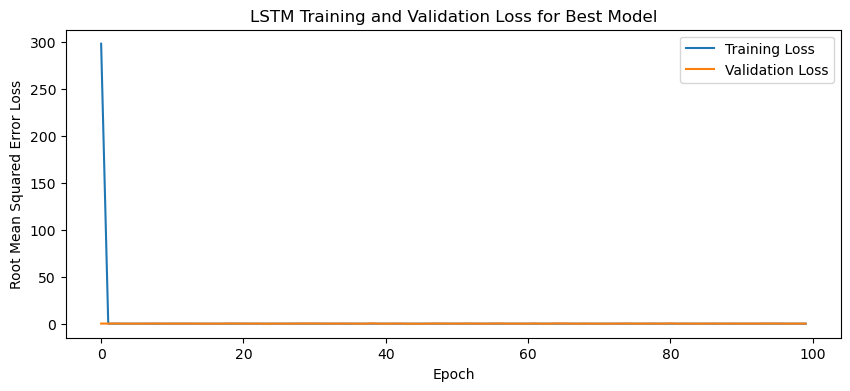

1/1 - 3s - loss: 0.0743 - 3s/epoch - 3s/step
Test Loss: 0.07430887222290039
1/1 [==============================] - 0s 149ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

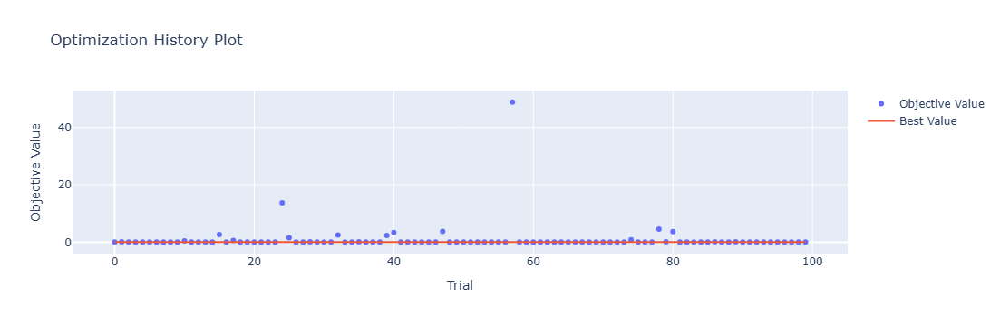

In [4]:
optuna.visualization.plot_optimization_history(study)

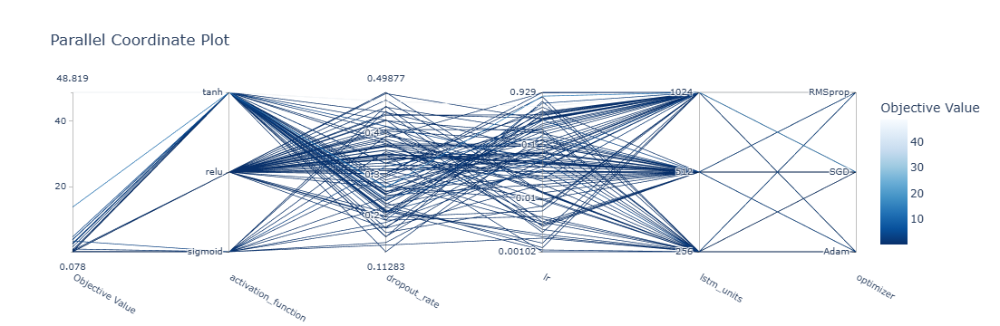

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

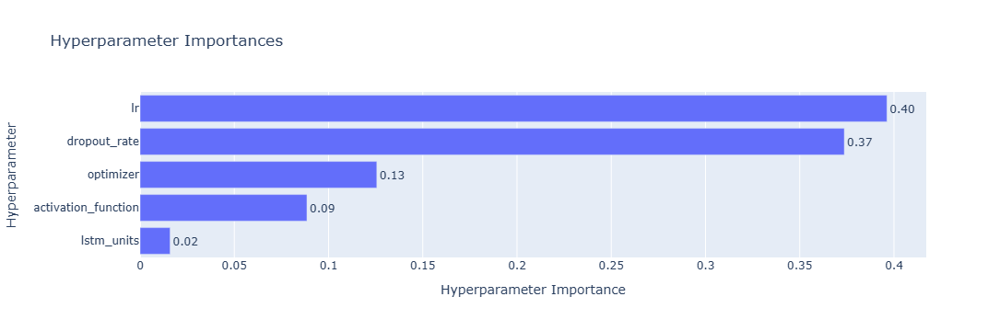

In [6]:
optuna.visualization.plot_param_importances(study)

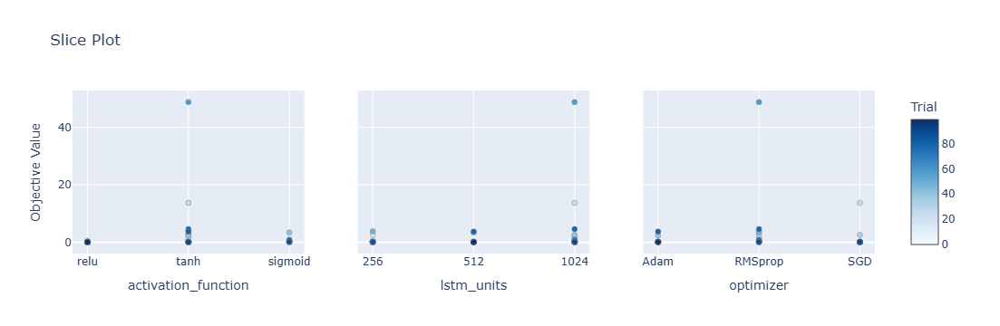

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

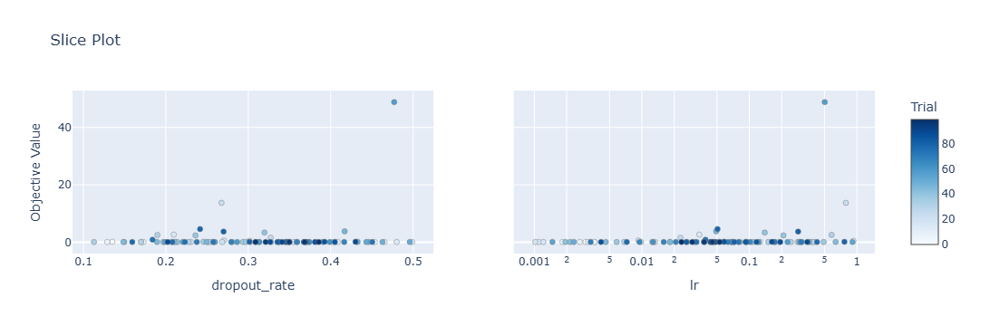

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 47s 256ms/step - loss: 156.4168 - accuracy: 0.6667 - mae: 155.2918 - rmse: 156.4168 - mape: 29493.9609 - pearson: 0.7311 - val_loss: 0.3905 - val_accuracy: 0.0000e+00 - val_mae: 0.2712 - val_rmse: 0.3905 - val_mape: 59.2473 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 18s 209ms/step - loss: 2.2476 - accuracy: 0.8095 - mae: 2.2060 - rmse: 2.2476 - mape: 417.9077 - pearson: 0.7354 - val_loss: 0.1056 - val_accuracy: 0.0000e+00 - val_mae: 0.0917 - val_rmse: 0.1056 - val_mape: 20.3432 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 18s 221ms/step - loss: 0.1209 - accuracy: 0.7857 - mae: 0.1038 - rmse: 0.1209 - mape: 19.1096 - pearson: 0.7711 - val_loss: 0.3852 - val_accuracy: 0.0000e+00 - val_mae: 0.2945 - val_rmse: 0.3852 - val_mape: 64.7050 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 18s 215ms/step - loss: 0.1192 - accuracy: 0.8690 - mae: 0.1020 - rmse: 0.119

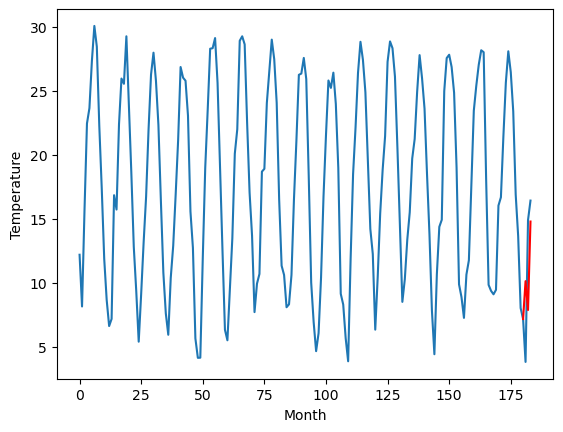

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		9.17		0.64
8.44		6.91		-1.53
13.50		13.82		0.32
[180, 181, 182, 183]
[13.23, 9.167435998916627, 6.914216871261598, 13.823615427017213]


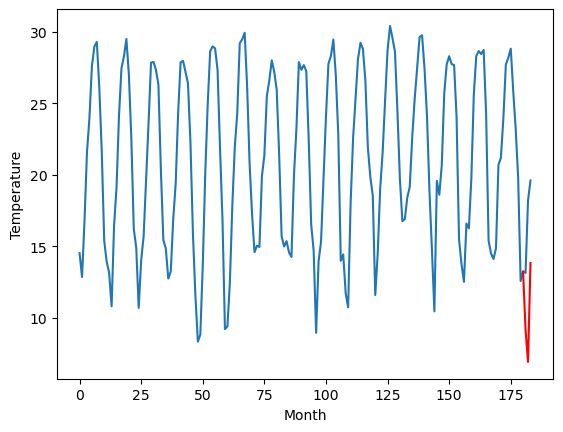

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.31		7.79		0.48
8.17		5.53		-2.64
14.15		12.44		-1.71
[180, 181, 182, 183]
[7.18, 7.787435998916626, 5.534216871261597, 12.443615427017212]


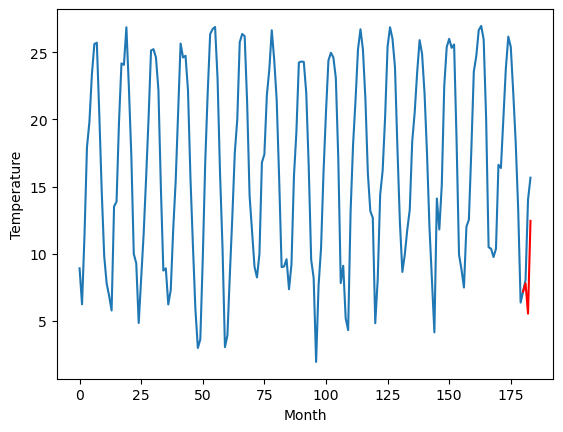

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.38		6.59		1.21
3.81		4.33		0.52
11.72		11.24		-0.48
[180, 181, 182, 183]
[11.46, 6.587435998916626, 4.334216871261597, 11.243615427017211]


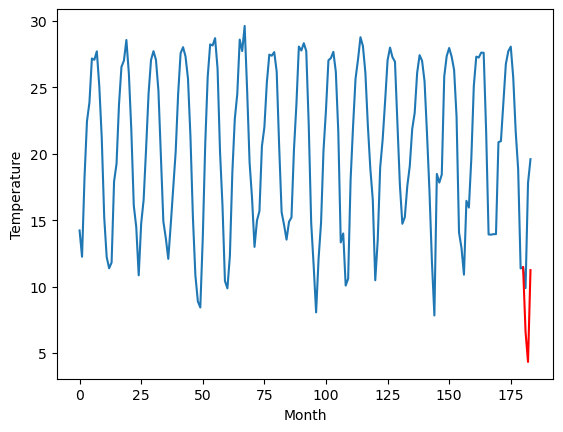

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.33		13.51		2.18
8.24		11.25		3.01
18.14		18.16		0.02
[180, 181, 182, 183]
[9.27, 13.507435998916627, 11.254216871261598, 18.163615427017213]


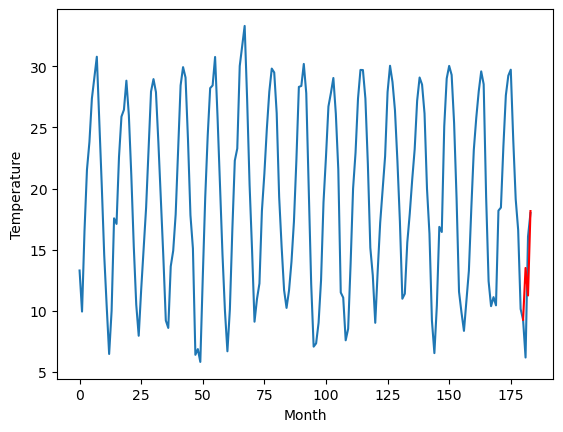

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.74		15.82		3.08
13.39		13.56		0.17
18.29		20.47		2.18
[180, 181, 182, 183]
[7.77, 15.817435998916626, 13.564216871261596, 20.47361542701721]


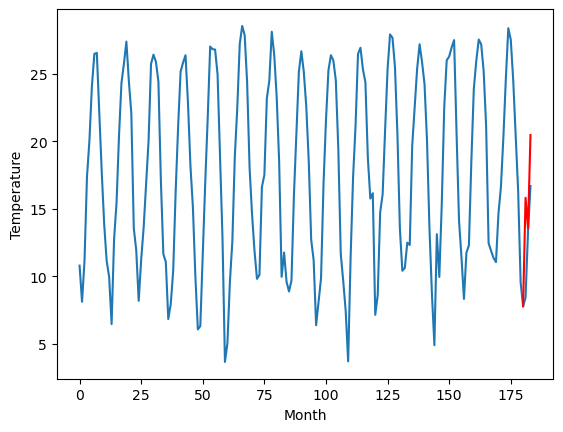

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.33		10.21		1.88
8.97		7.95		-1.02
15.95		14.86		-1.09
[180, 181, 182, 183]
[6.59, 10.207435998916626, 7.954216871261597, 14.863615427017212]


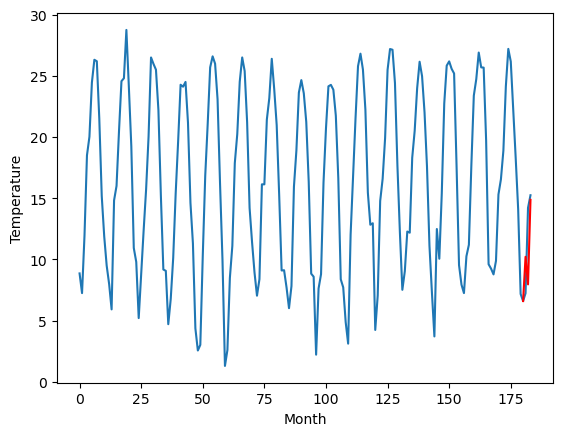

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.29		15.53		2.24
13.91		13.27		-0.64
20.43		20.18		-0.25
[180, 181, 182, 183]
[5.3, 15.527435998916626, 13.274216871261597, 20.183615427017212]


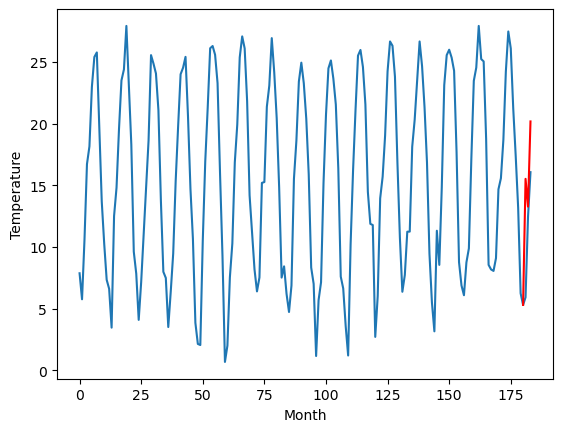

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.51		14.60		2.09
8.24		12.34		4.10
20.71		19.25		-1.46
[180, 181, 182, 183]
[3.1, 14.597435998916627, 12.344216871261597, 19.253615427017213]


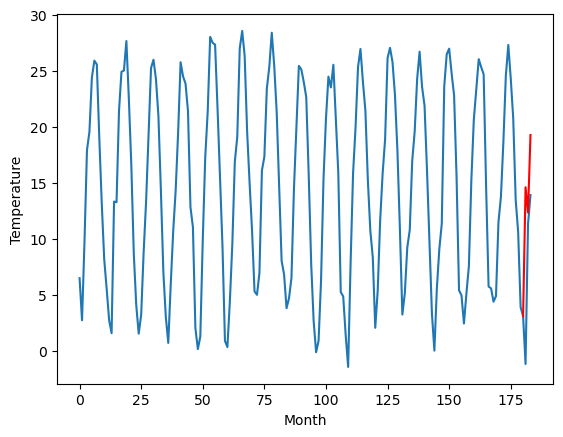

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.20		12.09		2.89
7.03		9.83		2.80
17.78		16.74		-1.04
[180, 181, 182, 183]
[0.6, 12.087435998916625, 9.834216871261596, 16.74361542701721]


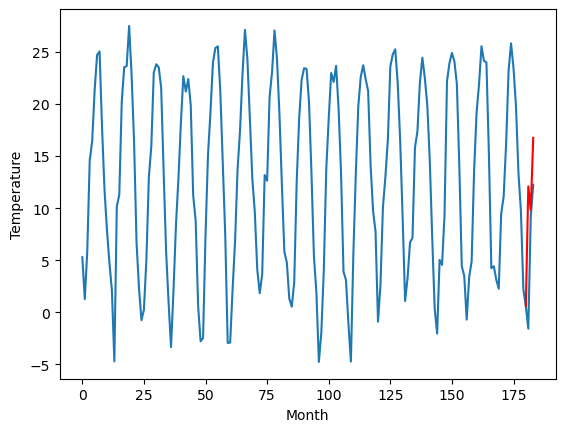

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.24		10.15		2.91
2.93		7.89		4.96
14.66		14.80		0.14
[180, 181, 182, 183]
[-0.75, 10.147435998916626, 7.894216871261596, 14.803615427017212]


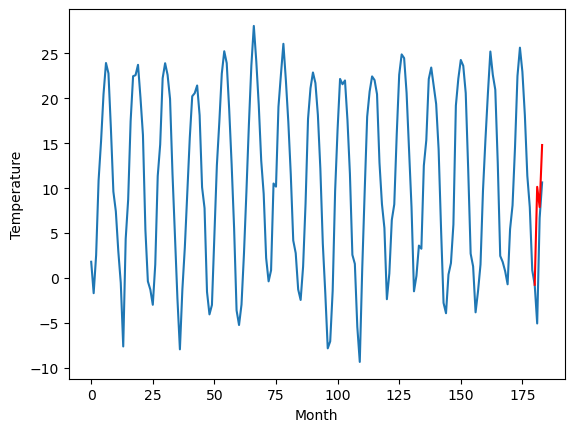

RangeIndex(start=1, stop=12, step=1)
[7.989999999999999, 8.53, 7.310000000000001, 5.3800000000000034, 11.33, 12.739999999999998, 8.33, 13.29, 12.51, 9.2, 7.24]
[10.147435998916626, 9.167435998916627, 7.787435998916626, 6.587435998916626, 13.507435998916627, 15.817435998916626, 10.207435998916626, 15.527435998916626, 14.597435998916627, 12.087435998916625, 10.147435998916626]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.99  10.147436
1                 1    8.53   9.167436
2                 2    7.31   7.787436
3                 3    5.38   6.587436
4                 4   11.33  13.507436
5                 5   12.74  15.817436
6                 6    8.33  10.207436
7                 7   13.29  15.527436
8                 8   12.51  14.597436
9                 9    9.20  12.087436
10               10    7.24  10.147436


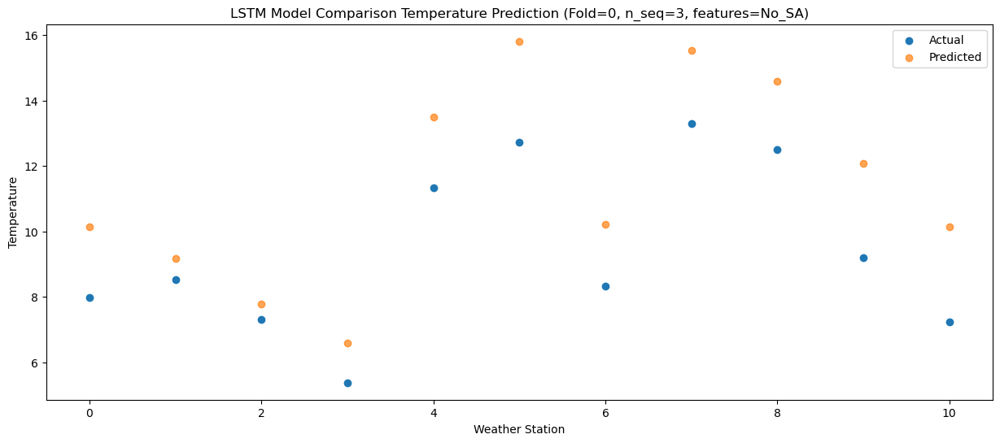

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.64   7.894217
1                 1    8.44   6.914217
2                 2    8.17   5.534217
3                 3    3.81   4.334217
4                 4    8.24  11.254217
5                 5   13.39  13.564217
6                 6    8.97   7.954217
7                 7   13.91  13.274217
8                 8    8.24  12.344217
9                 9    7.03   9.834217
10               10    2.93   7.894217


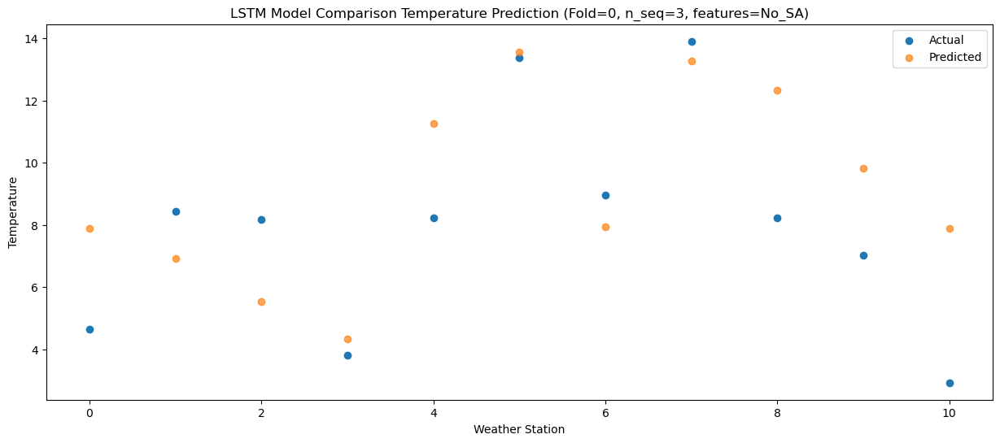

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.71  14.803615
1                 1   13.50  13.823615
2                 2   14.15  12.443615
3                 3   11.72  11.243615
4                 4   18.14  18.163615
5                 5   18.29  20.473615
6                 6   15.95  14.863615
7                 7   20.43  20.183615
8                 8   20.71  19.253615
9                 9   17.78  16.743615
10               10   14.66  14.803615


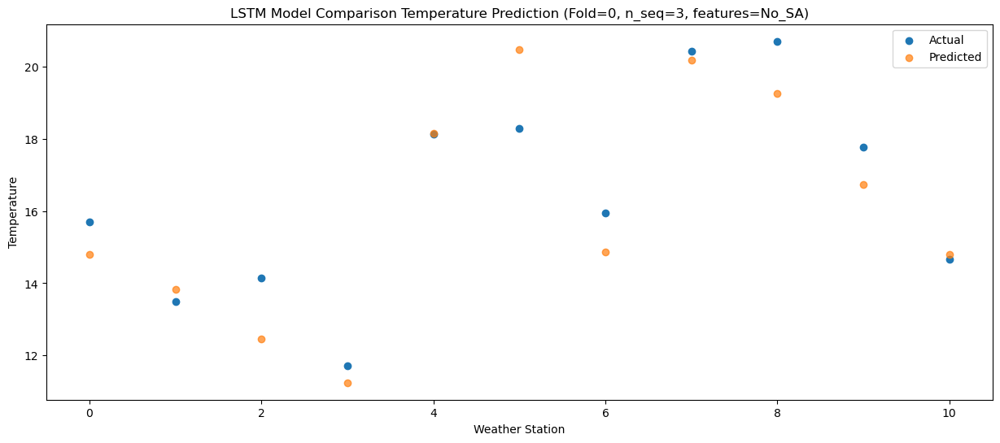

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (1, 1, 1024)              12263424  
                                                                 
 dropout (Dropout)           (1, 1, 1024)              0         
                                                                 
 lstm_1 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_1 (Dropout)         (1, 1024)                 0         
                                                                 
 dense (Dense)               (1, 256)                  262400    
                                                                 
 dense_1 (Dense)             (1, 128)                  32896     
                                                                 
 dense_2 (Dense)             (1, 3)                    3

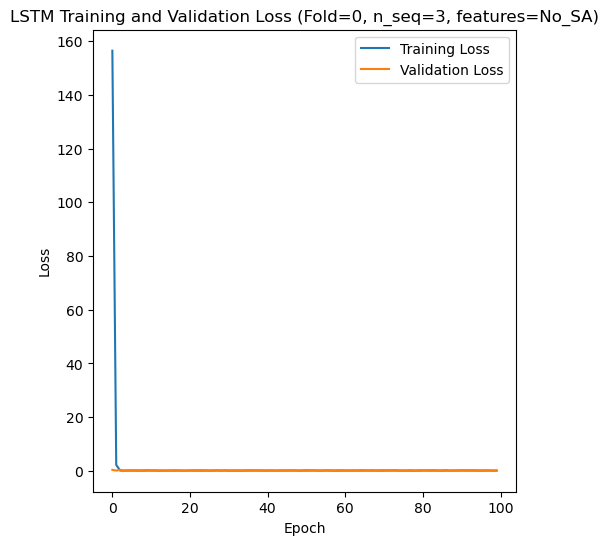

Epoch 1/100
84/84 [==============================] - 53s 237ms/step - loss: 267.5276 - accuracy: 0.8095 - mae: 266.2345 - rmse: 267.5276 - mape: 48117.2188 - pearson: 0.7682 - val_loss: 0.1451 - val_accuracy: 0.0000e+00 - val_mae: 0.1197 - val_rmse: 0.1451 - val_mape: 25.6849 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 12s 149ms/step - loss: 0.1103 - accuracy: 0.8452 - mae: 0.0960 - rmse: 0.1103 - mape: 17.8064 - pearson: 0.8083 - val_loss: 0.1576 - val_accuracy: 0.0000e+00 - val_mae: 0.1145 - val_rmse: 0.1576 - val_mape: 24.5028 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 12s 143ms/step - loss: 0.1246 - accuracy: 0.8452 - mae: 0.1100 - rmse: 0.1246 - mape: 20.9065 - pearson: 0.8064 - val_loss: 0.3679 - val_accuracy: 0.0000e+00 - val_mae: 0.3224 - val_rmse: 0.3679 - val_mape: 68.5662 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 13s 152ms/step - loss: 0.1347 - accuracy: 0.8452 - mae: 0.1145 - rmse: 0.1347

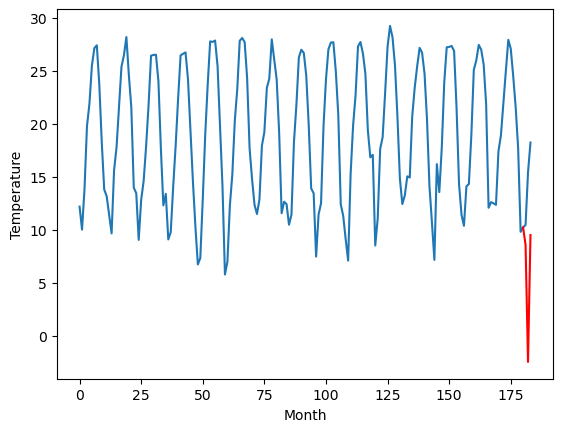

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.49		7.17		-0.32
8.15		-3.89		-12.04
14.92		8.08		-6.84
[180, 181, 182, 183]
[6.41, 7.171290698051453, -3.8922411775588985, 8.083362879753114]


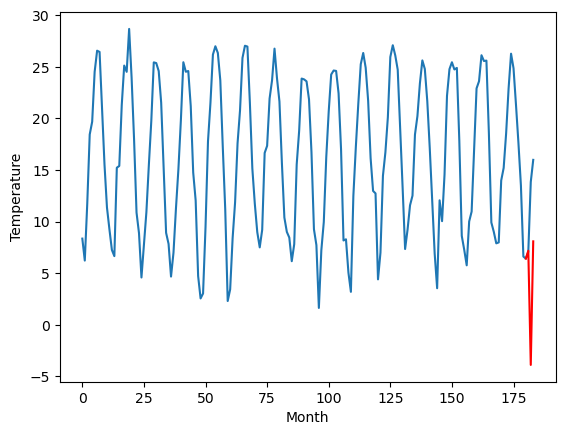

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.35		8.41		-0.94
9.84		-2.65		-12.49
16.90		9.32		-7.58
[180, 181, 182, 183]
[7.6, 8.411290698051452, -2.652241177558899, 9.323362879753113]


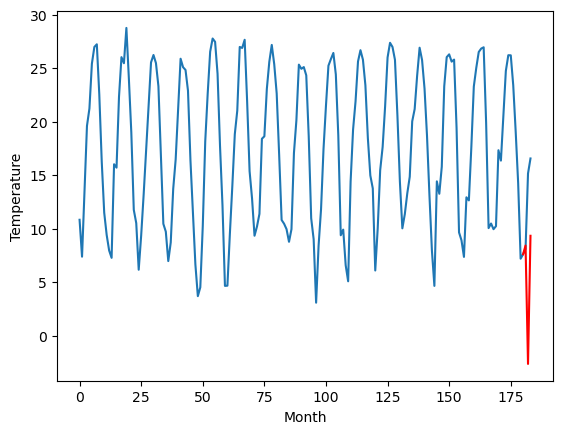

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.86		7.44		-0.42
6.27		-3.62		-9.89
13.64		8.35		-5.29
[180, 181, 182, 183]
[11.89, 7.441290698051453, -3.622241177558899, 8.353362879753114]


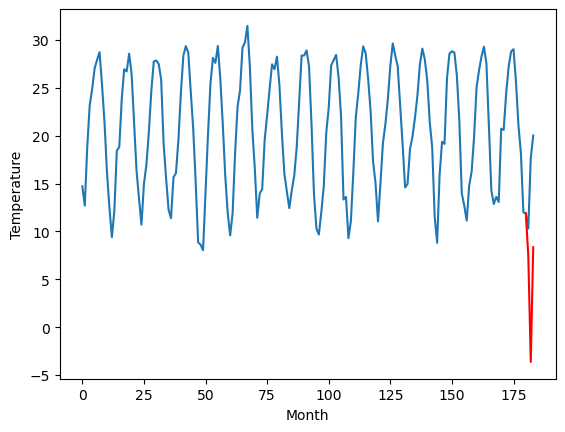

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.19		11.68		-0.51
10.49		0.62		-9.87
18.10		12.59		-5.51
[180, 181, 182, 183]
[10.96, 11.681290698051452, 0.6177588224411004, 12.593362879753112]


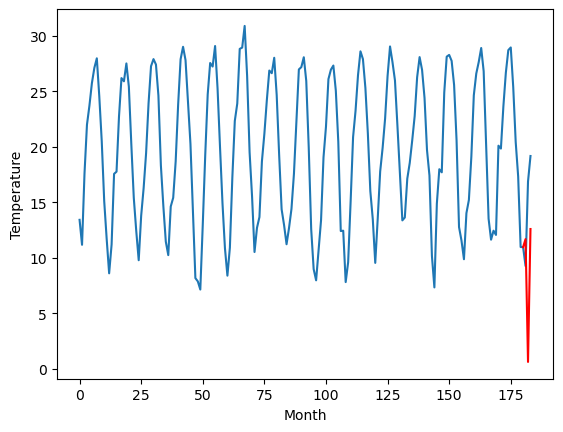

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.84		7.83		0.99
7.22		-3.23		-10.45
14.56		8.74		-5.82
[180, 181, 182, 183]
[7.75, 7.831290698051452, -3.2322411775588993, 8.743362879753112]


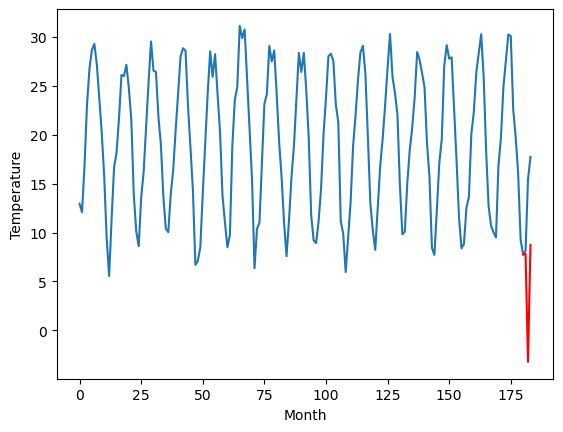

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.62		10.30		-0.32
11.40		-0.76		-12.16
17.68		11.21		-6.47
[180, 181, 182, 183]
[6.17, 10.301290698051453, -0.7622411775588986, 11.213362879753113]


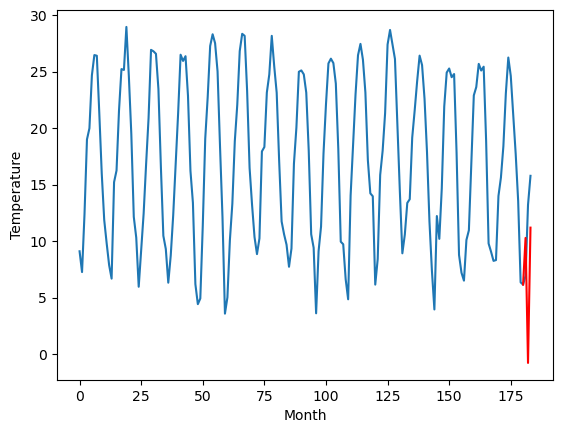

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.40		14.19		-0.21
11.40		3.13		-8.27
22.72		15.10		-7.62
[180, 181, 182, 183]
[4.57, 14.191290698051453, 3.127758822441102, 15.103362879753114]


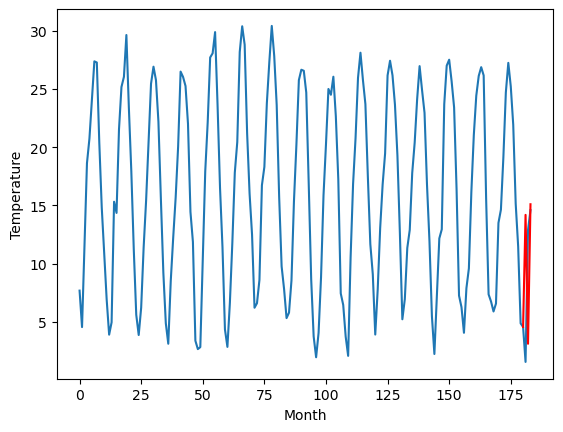

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.07		12.90		-0.17
8.29		1.84		-6.45
20.85		13.81		-7.04
[180, 181, 182, 183]
[5.46, 12.901290698051453, 1.837758822441101, 13.813362879753113]


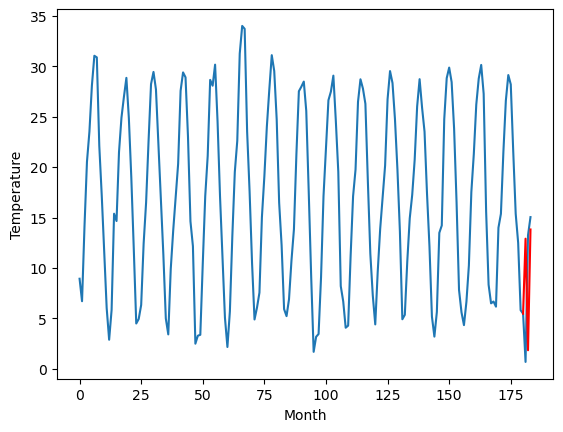

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.06		12.43		-0.63
8.69		1.37		-7.32
19.40		13.34		-6.06
[180, 181, 182, 183]
[5.42, 12.431290698051452, 1.3677588224411004, 13.343362879753112]


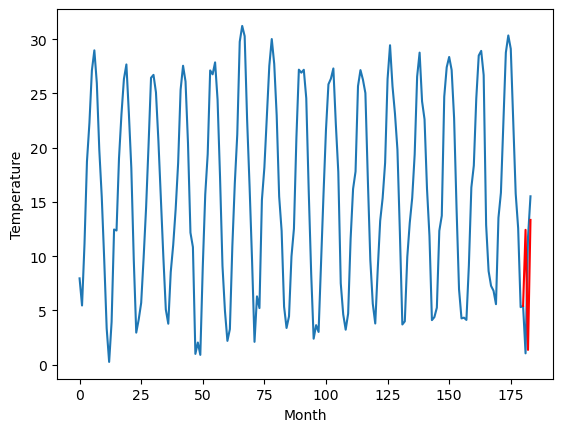

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.28		8.60		1.32
6.32		-2.46		-8.78
13.54		9.51		-4.03
[180, 181, 182, 183]
[2.17, 8.601290698051452, -2.4622411775588997, 9.513362879753112]


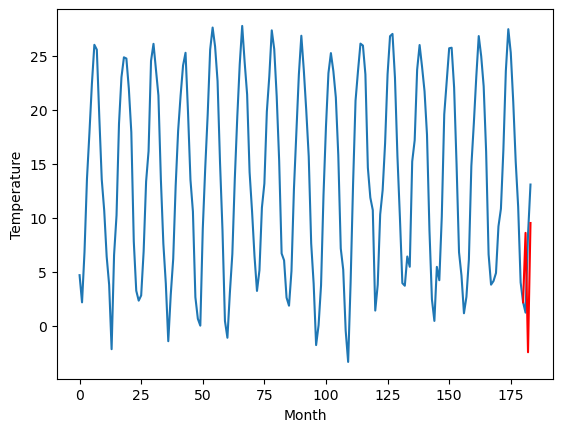

RangeIndex(start=1, stop=12, step=1)
[9.54, 7.489999999999999, 9.35, 7.859999999999999, 12.189999999999998, 6.84, 10.62, 14.4, 13.07, 13.06, 7.279999999999999]
[8.601290698051452, 7.171290698051453, 8.411290698051452, 7.441290698051453, 11.681290698051452, 7.831290698051452, 10.301290698051453, 14.191290698051453, 12.901290698051453, 12.431290698051452, 8.601290698051452]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    9.54   8.601291
1                 1    7.49   7.171291
2                 2    9.35   8.411291
3                 3    7.86   7.441291
4                 4   12.19  11.681291
5                 5    6.84   7.831291
6                 6   10.62  10.301291
7                 7   14.40  14.191291
8                 8   13.07  12.901291
9                 9   13.06  12.431291
10               10    7.28   8.601291


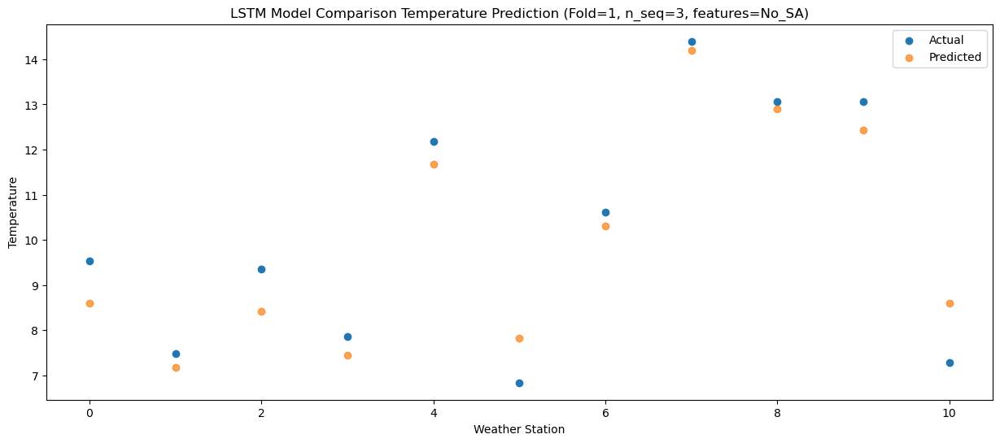

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    9.76  -2.462241
1                 1    8.15  -3.892241
2                 2    9.84  -2.652241
3                 3    6.27  -3.622241
4                 4   10.49   0.617759
5                 5    7.22  -3.232241
6                 6   11.40  -0.762241
7                 7   11.40   3.127759
8                 8    8.29   1.837759
9                 9    8.69   1.367759
10               10    6.32  -2.462241


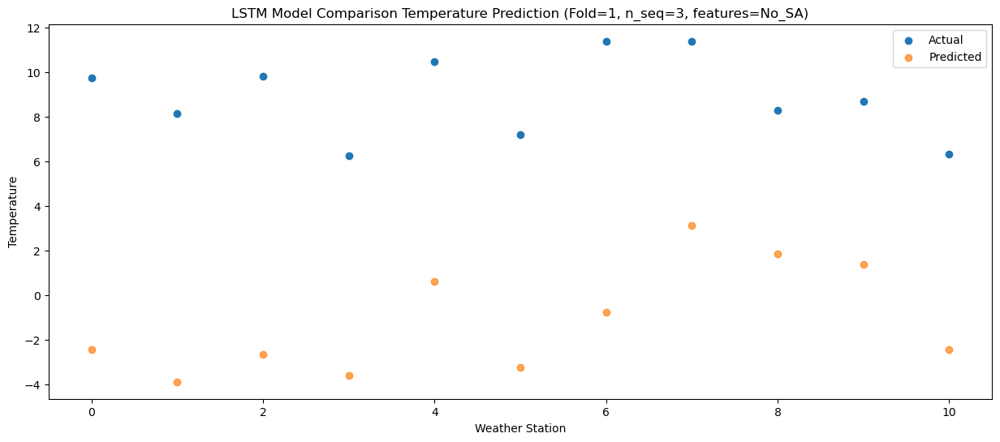

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   14.74   9.513363
1                 1   14.92   8.083363
2                 2   16.90   9.323363
3                 3   13.64   8.353363
4                 4   18.10  12.593363
5                 5   14.56   8.743363
6                 6   17.68  11.213363
7                 7   22.72  15.103363
8                 8   20.85  13.813363
9                 9   19.40  13.343363
10               10   13.54   9.513363


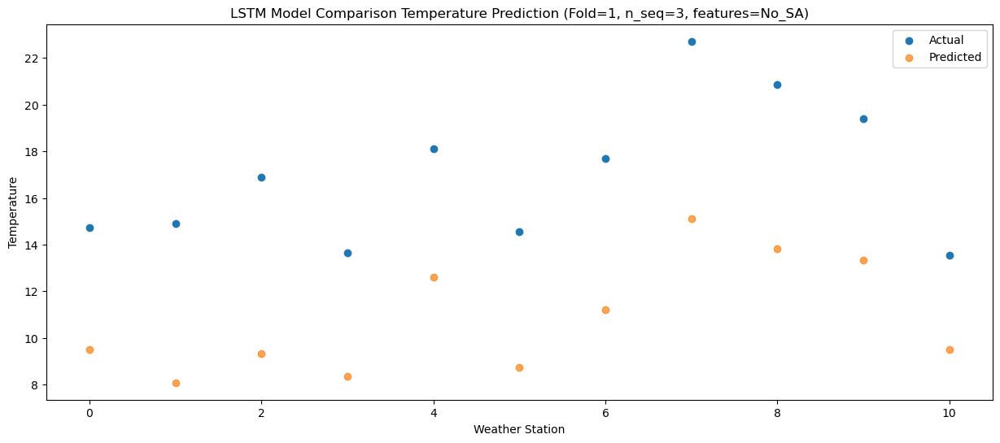

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (1, 1, 1024)              12263424  
                                                                 
 dropout_2 (Dropout)         (1, 1, 1024)              0         
                                                                 
 lstm_3 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_3 (Dropout)         (1, 1024)                 0         
                                                                 
 dense_3 (Dense)             (1, 256)                  262400    
                                                                 
 dense_4 (Dense)             (1, 128)                  32896     
                                                                 
 dense_5 (Dense)             (1, 3)                   

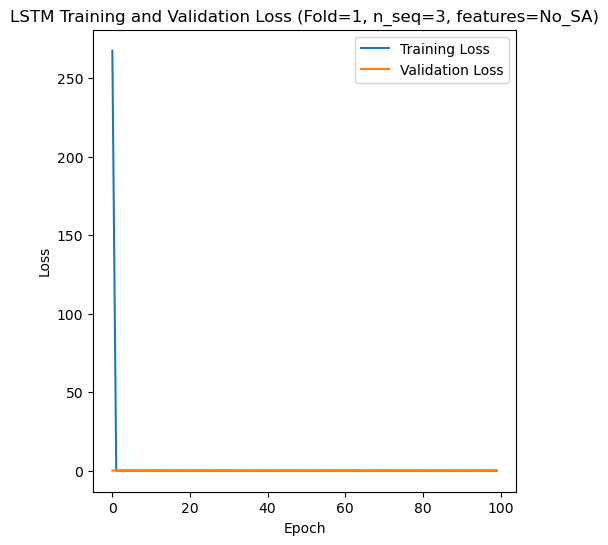

Epoch 1/100
84/84 [==============================] - 54s 279ms/step - loss: 255.6194 - accuracy: 0.7619 - mae: 254.6824 - rmse: 255.6194 - mape: 49949.6719 - pearson: 0.7042 - val_loss: 0.2112 - val_accuracy: 0.0000e+00 - val_mae: 0.1517 - val_rmse: 0.2112 - val_mape: 34.1238 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 13s 155ms/step - loss: 0.1182 - accuracy: 0.8333 - mae: 0.1023 - rmse: 0.1182 - mape: 19.4399 - pearson: 0.7253 - val_loss: 0.1988 - val_accuracy: 0.0000e+00 - val_mae: 0.1688 - val_rmse: 0.1988 - val_mape: 37.8459 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 5s 62ms/step - loss: 0.1179 - accuracy: 0.8095 - mae: 0.1013 - rmse: 0.1179 - mape: 19.1060 - pearson: 0.7704 - val_loss: 0.3378 - val_accuracy: 0.0000e+00 - val_mae: 0.2467 - val_rmse: 0.3378 - val_mape: 55.2985 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 5s 63ms/step - loss: 0.1234 - accuracy: 0.7976 - mae: 0.1082 - rmse: 0.1234 - m

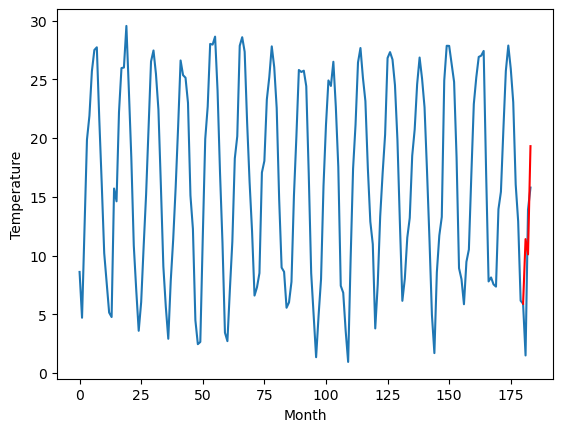

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.69		6.03		-0.66
2.65		4.73		2.08
12.84		13.95		1.11
[180, 181, 182, 183]
[2.63, 6.033968825340271, 4.73494174003601, 13.946408529281616]


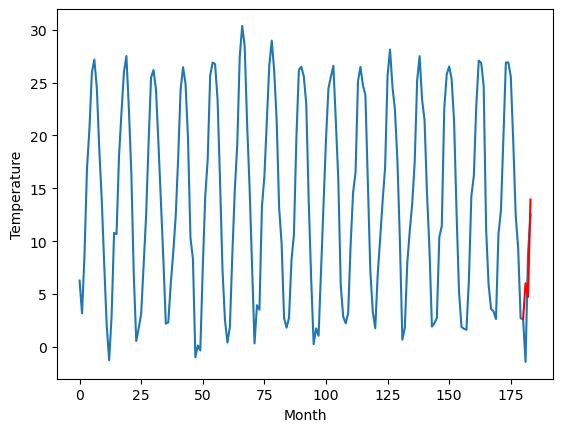

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.70		11.30		-1.40
15.43		10.00		-5.43
17.24		19.22		1.98
[180, 181, 182, 183]
[16.55, 11.30396882534027, 10.00494174003601, 19.216408529281615]


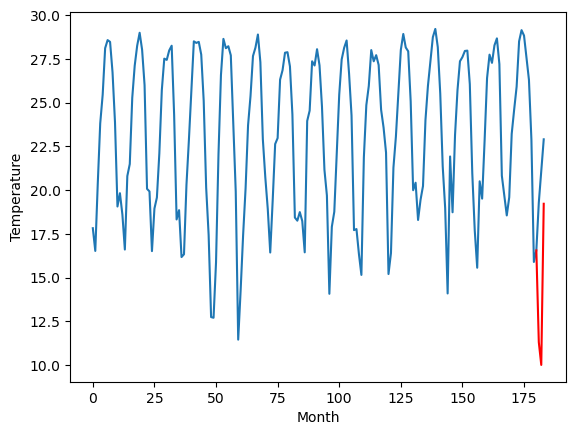

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.49		7.83		2.34
5.51		6.53		1.02
9.62		15.75		6.13
[180, 181, 182, 183]
[-0.83, 7.833968825340271, 6.534941740036011, 15.746408529281616]


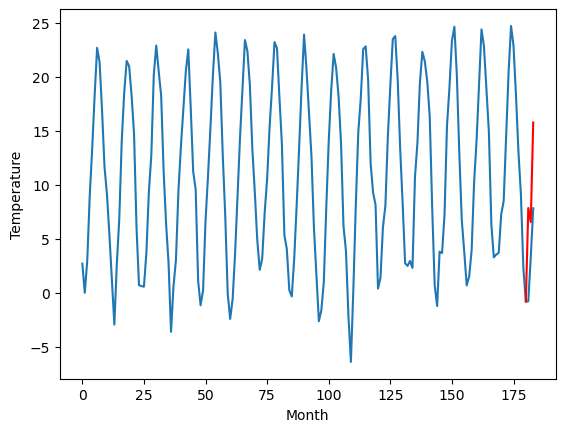

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.96		7.87		-1.09
8.22		6.57		-1.65
15.55		15.79		0.24
[180, 181, 182, 183]
[11.52, 7.87396882534027, 6.57494174003601, 15.786408529281616]


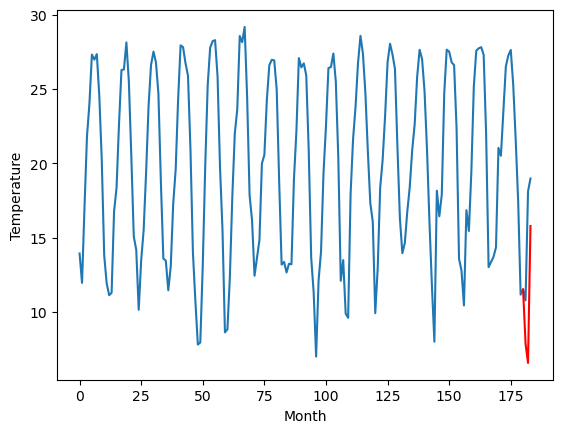

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.69		5.54		-0.15
3.34		4.24		0.90
11.72		13.46		1.74
[180, 181, 182, 183]
[11.47, 5.543968825340271, 4.244941740036011, 13.456408529281617]


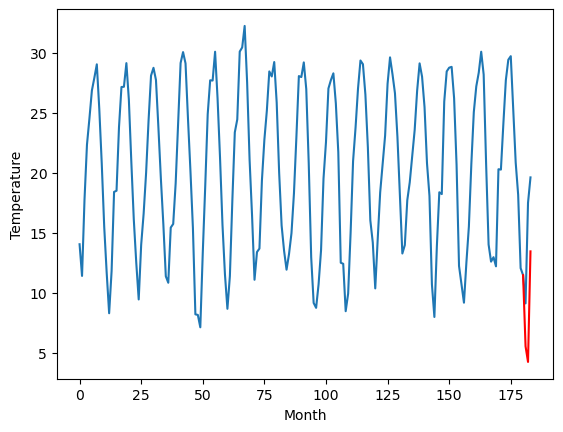

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
17.12		17.08		-0.04
14.01		15.78		1.77
24.38		25.00		0.62
[180, 181, 182, 183]
[7.75, 17.08396882534027, 15.784941740036011, 24.996408529281616]


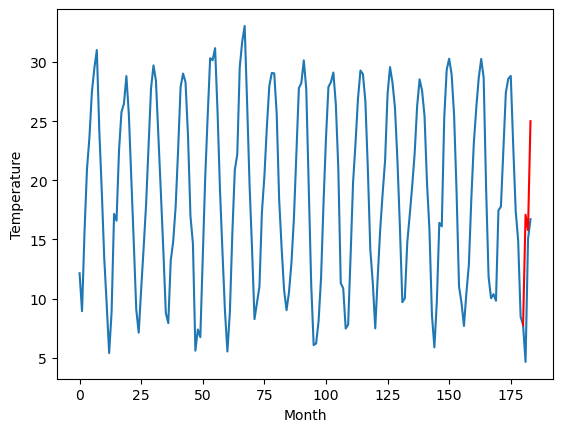

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.22		1.94		-1.28
6.14		0.64		-5.50
9.24		9.86		0.62
[180, 181, 182, 183]
[4.9, 1.9439688253402712, 0.6449417400360109, 9.856408529281616]


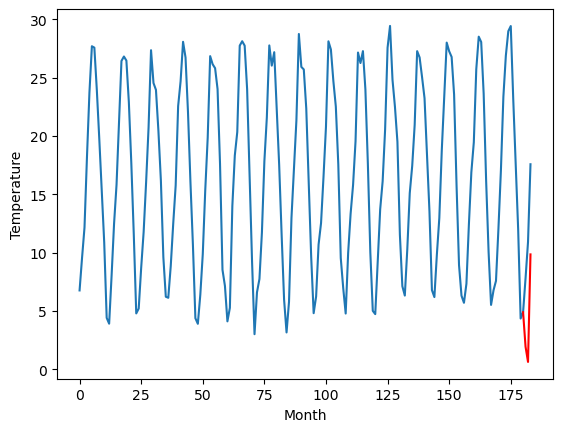

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.88		13.20		-0.68
12.96		11.90		-1.06
12.56		21.12		8.56
[180, 181, 182, 183]
[14.14, 13.20396882534027, 11.90494174003601, 21.116408529281614]


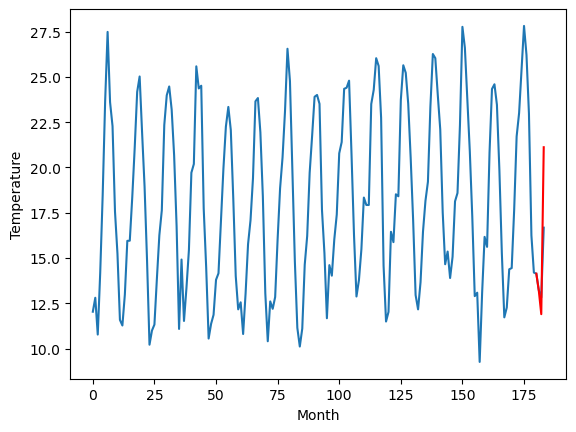

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.64		13.31		-0.33
14.14		12.01		-2.13
21.02		21.23		0.21
[180, 181, 182, 183]
[5.55, 13.313968825340272, 12.014941740036011, 21.226408529281617]


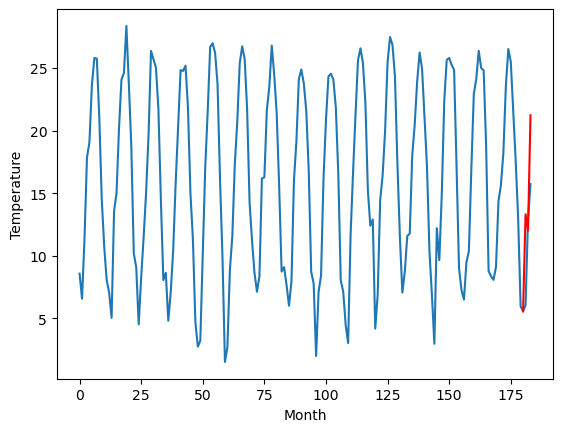

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.47		11.40		-1.07
13.82		10.10		-3.72
20.03		19.32		-0.71
[180, 181, 182, 183]
[3.19, 11.403968825340272, 10.104941740036011, 19.316408529281617]


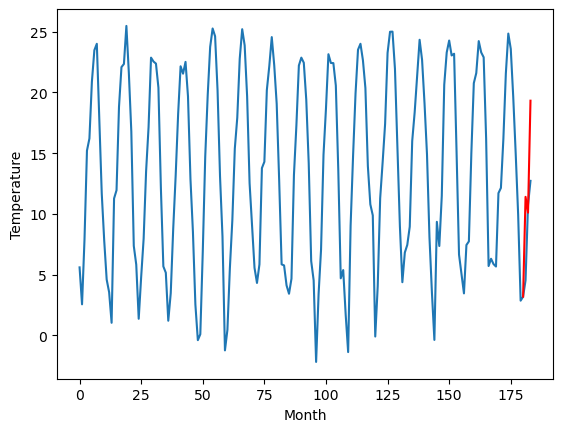

RangeIndex(start=1, stop=12, step=1)
[11.88, 6.69, 12.7, 5.490000000000001, 8.96, 5.69, 17.12, 3.2200000000000015, 13.880000000000003, 13.64, 12.47]
[11.403968825340272, 6.033968825340271, 11.30396882534027, 7.833968825340271, 7.87396882534027, 5.543968825340271, 17.08396882534027, 1.9439688253402712, 13.20396882534027, 13.313968825340272, 11.403968825340272]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   11.88  11.403969
1                 1    6.69   6.033969
2                 2   12.70  11.303969
3                 3    5.49   7.833969
4                 4    8.96   7.873969
5                 5    5.69   5.543969
6                 6   17.12  17.083969
7                 7    3.22   1.943969
8                 8   13.88  13.203969
9                 9   13.64  13.313969
10               10   12.47  11.403969


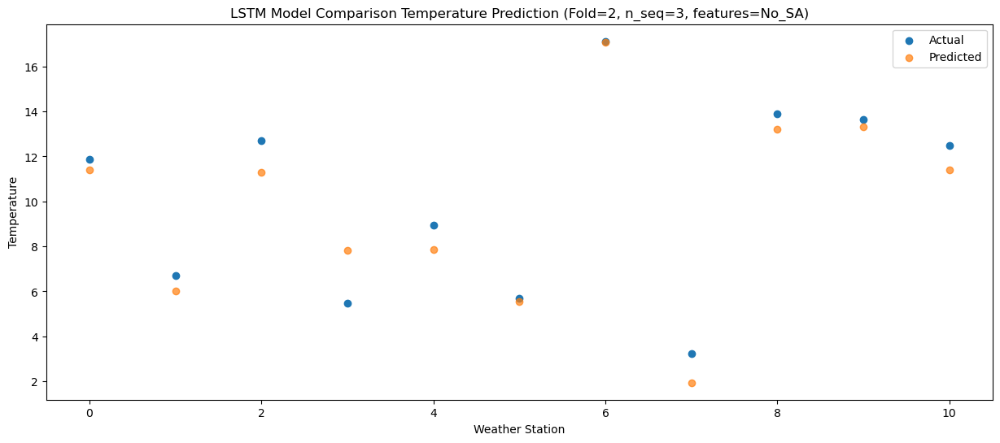

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    7.48  10.104942
1                 1    2.65   4.734942
2                 2   15.43  10.004942
3                 3    5.51   6.534942
4                 4    8.22   6.574942
5                 5    3.34   4.244942
6                 6   14.01  15.784942
7                 7    6.14   0.644942
8                 8   12.96  11.904942
9                 9   14.14  12.014942
10               10   13.82  10.104942


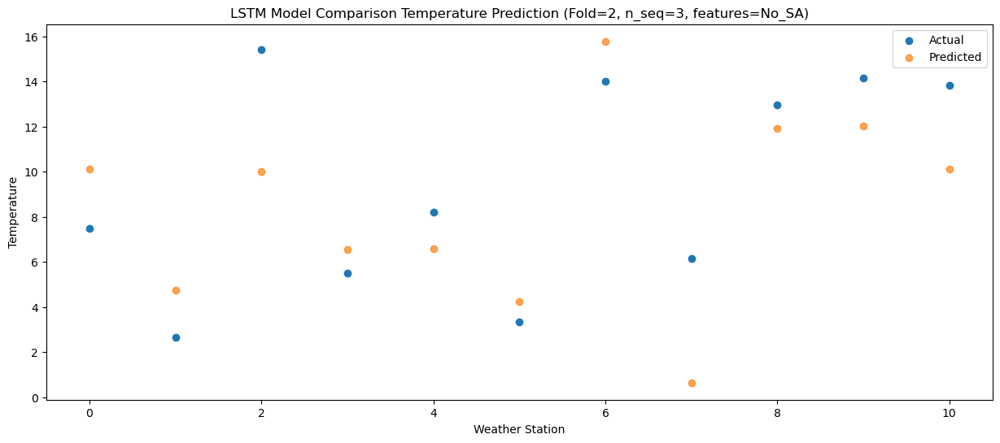

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   19.90  19.316409
1                 1   12.84  13.946409
2                 2   17.24  19.216409
3                 3    9.62  15.746409
4                 4   15.55  15.786409
5                 5   11.72  13.456409
6                 6   24.38  24.996409
7                 7    9.24   9.856409
8                 8   12.56  21.116409
9                 9   21.02  21.226409
10               10   20.03  19.316409


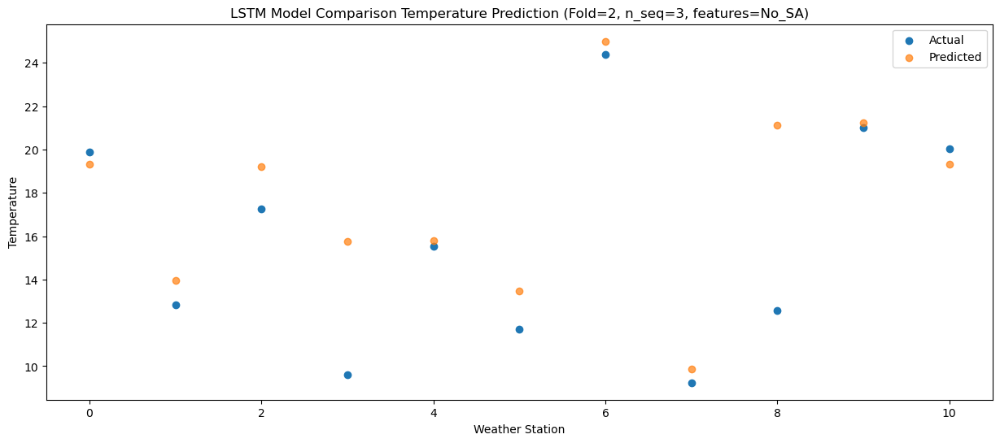

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (1, 1, 1024)              12263424  
                                                                 
 dropout_4 (Dropout)         (1, 1, 1024)              0         
                                                                 
 lstm_5 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_5 (Dropout)         (1, 1024)                 0         
                                                                 
 dense_6 (Dense)             (1, 256)                  262400    
                                                                 
 dense_7 (Dense)             (1, 128)                  32896     
                                                                 
 dense_8 (Dense)             (1, 3)                   

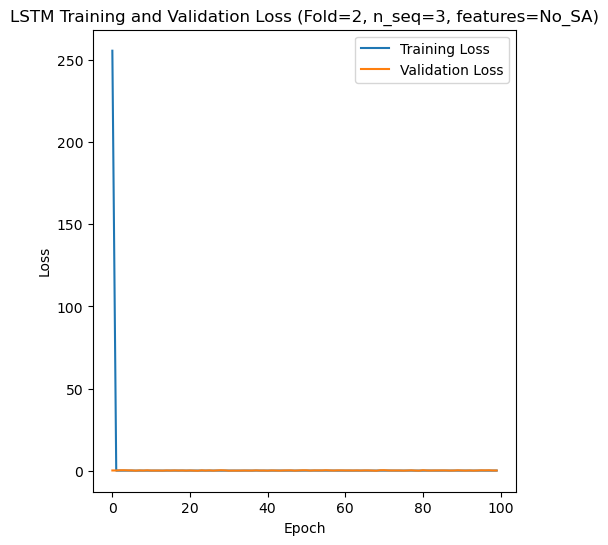

Epoch 1/100
84/84 [==============================] - 56s 273ms/step - loss: 286.2952 - accuracy: 0.7262 - mae: 285.9916 - rmse: 286.2952 - mape: 55936.8516 - pearson: 0.6506 - val_loss: 0.1095 - val_accuracy: 0.0000e+00 - val_mae: 0.0953 - val_rmse: 0.1095 - val_mape: 21.2051 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 14s 164ms/step - loss: 0.1524 - accuracy: 0.7857 - mae: 0.1307 - rmse: 0.1524 - mape: 24.4463 - pearson: 0.7425 - val_loss: 0.2005 - val_accuracy: 0.0000e+00 - val_mae: 0.1584 - val_rmse: 0.2005 - val_mape: 35.1996 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 14s 165ms/step - loss: 0.1316 - accuracy: 0.8690 - mae: 0.1142 - rmse: 0.1316 - mape: 21.4022 - pearson: 0.7699 - val_loss: 0.2028 - val_accuracy: 0.0000e+00 - val_mae: 0.1452 - val_rmse: 0.2028 - val_mape: 32.3815 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 14s 169ms/step - loss: 0.1150 - accuracy: 0.8810 - mae: 0.0997 - rmse: 0.1150

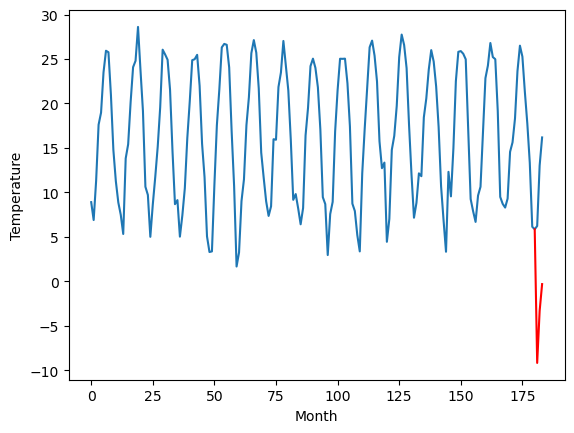

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.42		8.63		0.21
4.70		14.49		9.79
16.67		17.49		0.82
[180, 181, 182, 183]
[3.2, 8.625872678756714, 14.486798830032349, 17.492872066497803]


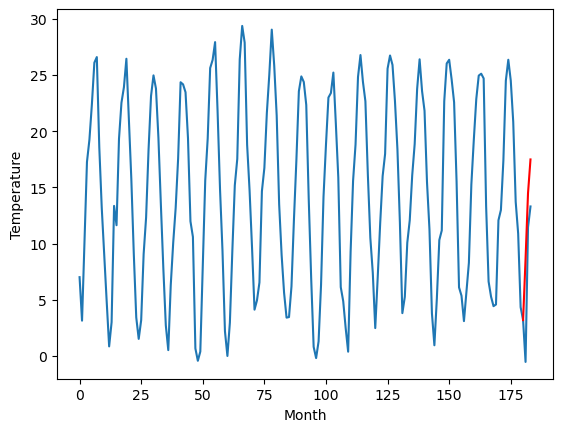

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.30		8.10		-2.20
12.60		13.96		1.36
13.75		16.96		3.21
[180, 181, 182, 183]
[8.48, 8.095872678756713, 13.956798830032348, 16.962872066497802]


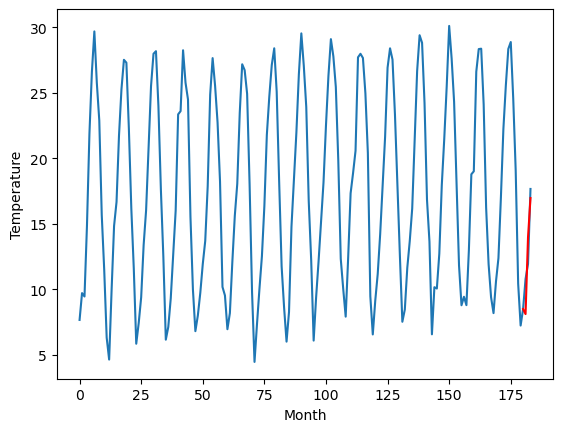

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.74		2.26		0.52
0.42		8.12		7.70
10.63		11.12		0.49
[180, 181, 182, 183]
[1.55, 2.255872678756714, 8.116798830032348, 11.122872066497802]


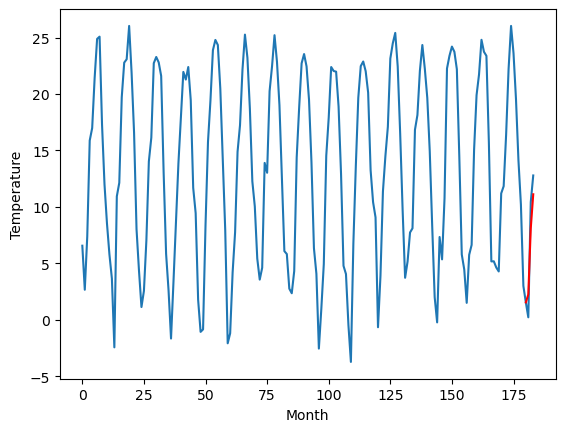

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.43		7.96		0.53
3.56		13.82		10.26
16.64		16.82		0.18
[180, 181, 182, 183]
[1.08, 7.955872678756714, 13.816798830032349, 16.8228720664978]


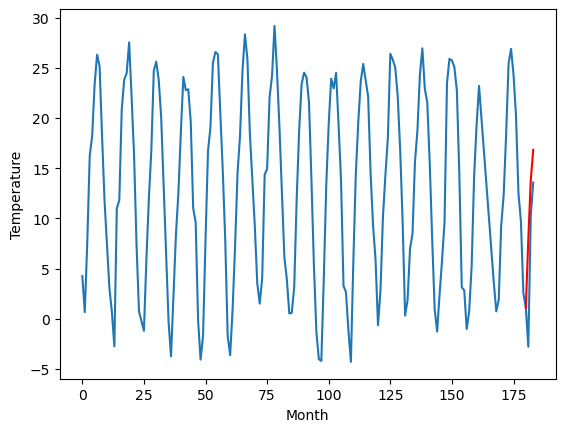

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.57		6.08		0.51
2.85		11.94		9.09
14.18		14.94		0.76
[180, 181, 182, 183]
[0.21, 6.075872678756713, 11.936798830032348, 14.942872066497802]


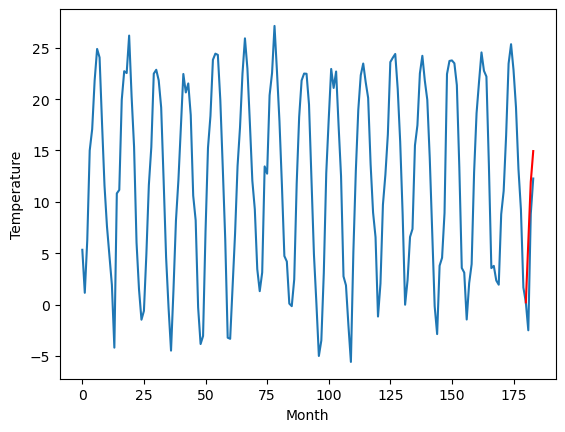

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.92		6.71		-1.21
8.02		12.57		4.55
10.99		15.57		4.58
[180, 181, 182, 183]
[-8.22, 6.705872678756714, 12.566798830032349, 15.572872066497803]


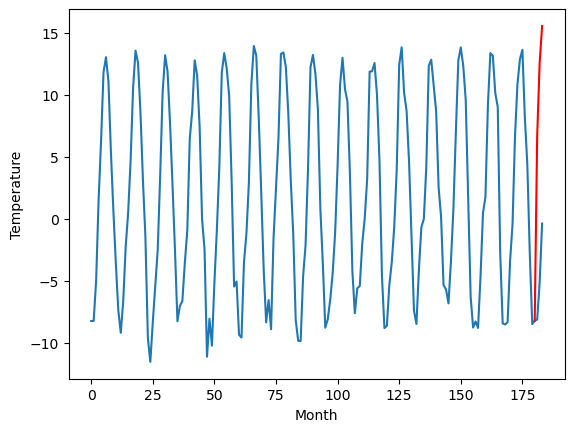

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.12		5.63		-1.49
9.97		11.49		1.52
11.57		14.49		2.92
[180, 181, 182, 183]
[10.04, 5.625872678756714, 11.486798830032349, 14.492872066497803]


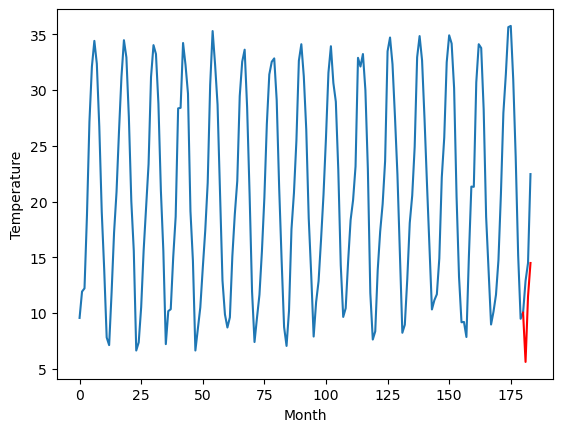

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.47		3.31		-2.16
6.40		9.17		2.77
6.18		12.17		5.99
[180, 181, 182, 183]
[9.17, 3.305872678756714, 9.166798830032349, 12.172872066497803]


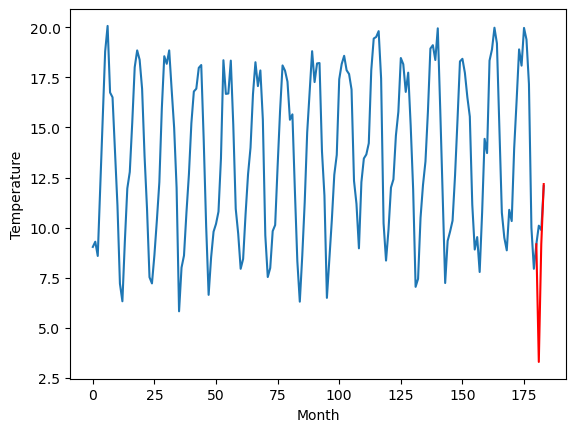

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.31		4.39		2.08
2.19		10.25		8.06
7.19		13.25		6.06
[180, 181, 182, 183]
[0.94, 4.385872678756714, 10.246798830032349, 13.252872066497803]


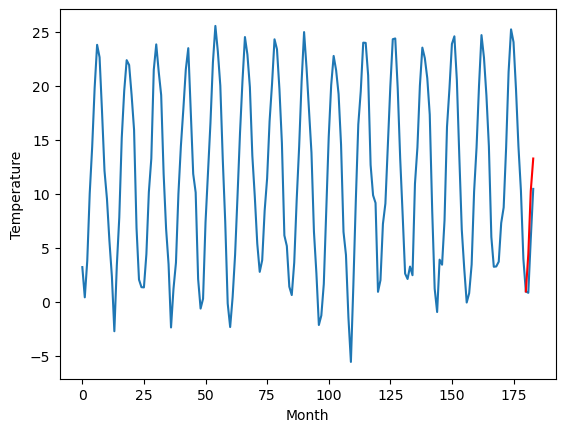

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-9.80		-9.18		0.62
-10.60		-3.32		7.28
-3.41		-0.32		3.09
[180, 181, 182, 183]
[-0.13, -9.184127321243286, -3.3232011699676516, -0.3171279335021975]


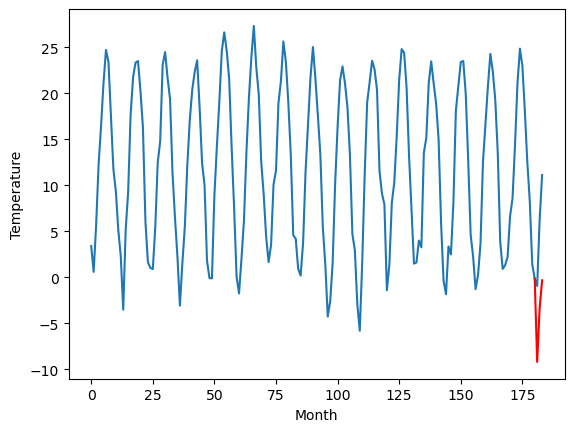

RangeIndex(start=1, stop=12, step=1)
[-8.520000000000001, 8.420000000000002, 10.299999999999999, 1.7399999999999998, 7.430000000000001, 5.5699999999999985, 7.92, 7.119999999999999, 5.4700000000000015, 2.3099999999999996, -9.8]
[-9.184127321243286, 8.625872678756714, 8.095872678756713, 2.255872678756714, 7.955872678756714, 6.075872678756713, 6.705872678756714, 5.625872678756714, 3.305872678756714, 4.385872678756714, -9.184127321243286]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   -8.52  -9.184127
1                 1    8.42   8.625873
2                 2   10.30   8.095873
3                 3    1.74   2.255873
4                 4    7.43   7.955873
5                 5    5.57   6.075873
6                 6    7.92   6.705873
7                 7    7.12   5.625873
8                 8    5.47   3.305873
9                 9    2.31   4.385873
10               10   -9.80  -9.184127


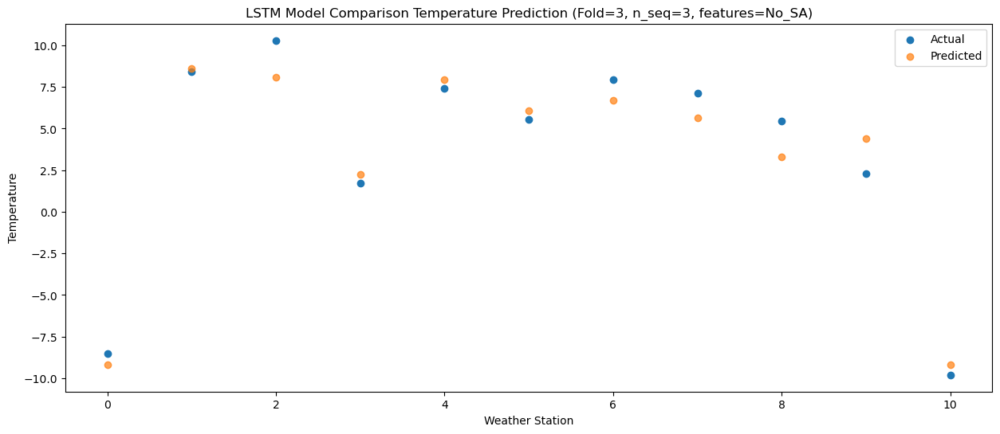

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -8.15  -3.323201
1                 1    4.70  14.486799
2                 2   12.60  13.956799
3                 3    0.42   8.116799
4                 4    3.56  13.816799
5                 5    2.85  11.936799
6                 6    8.02  12.566799
7                 7    9.97  11.486799
8                 8    6.40   9.166799
9                 9    2.19  10.246799
10               10  -10.60  -3.323201


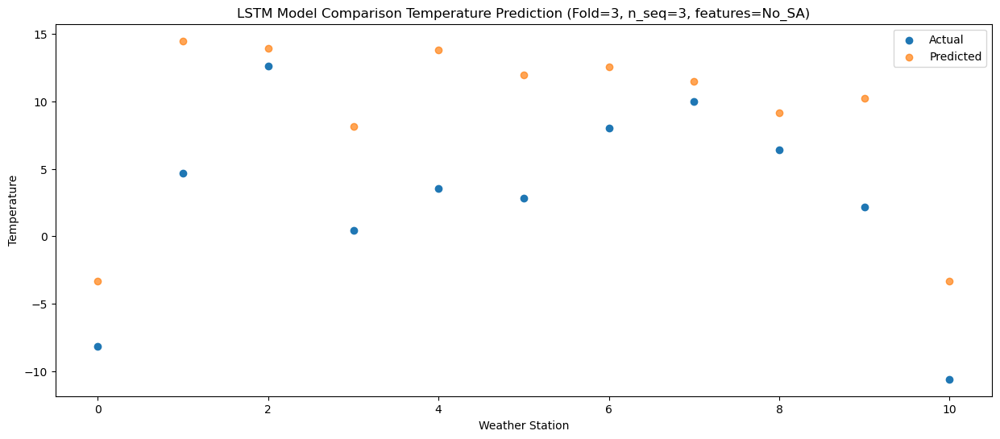

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   -1.35  -0.317128
1                 1   16.67  17.492872
2                 2   13.75  16.962872
3                 3   10.63  11.122872
4                 4   16.64  16.822872
5                 5   14.18  14.942872
6                 6   10.99  15.572872
7                 7   11.57  14.492872
8                 8    6.18  12.172872
9                 9    7.19  13.252872
10               10   -3.41  -0.317128


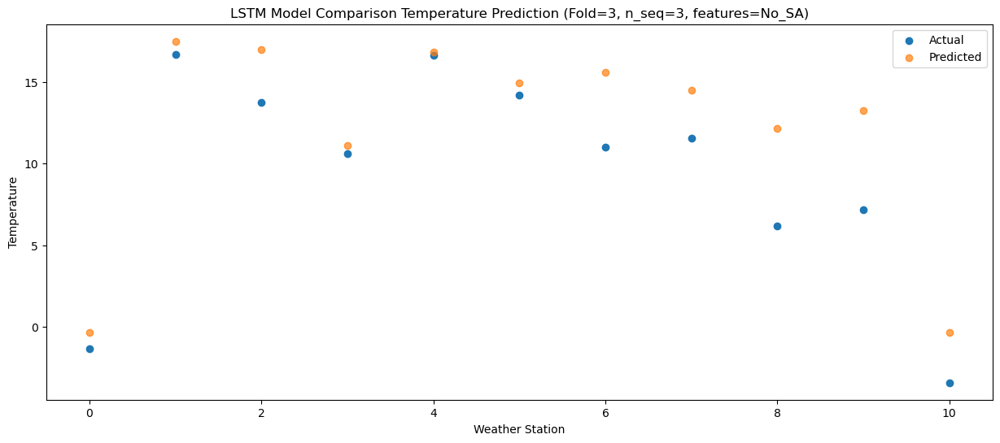

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (1, 1, 1024)              12263424  
                                                                 
 dropout_6 (Dropout)         (1, 1, 1024)              0         
                                                                 
 lstm_7 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_7 (Dropout)         (1, 1024)                 0         
                                                                 
 dense_9 (Dense)             (1, 256)                  262400    
                                                                 
 dense_10 (Dense)            (1, 128)                  32896     
                                                                 
 dense_11 (Dense)            (1, 3)                   

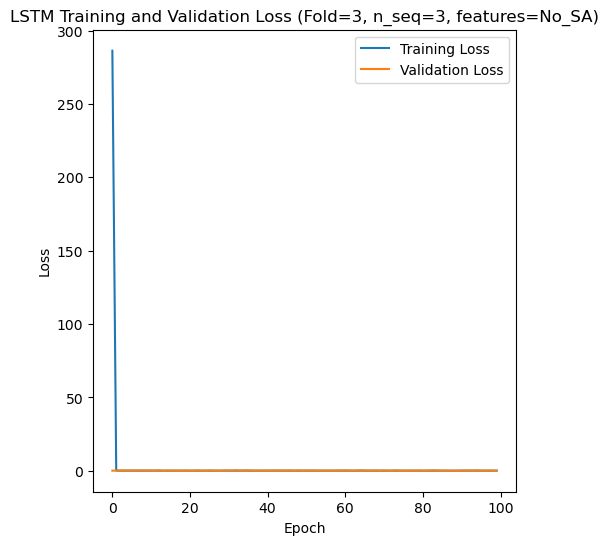

Epoch 1/100
84/84 [==============================] - 58s 313ms/step - loss: 258.6283 - accuracy: 0.6905 - mae: 257.0185 - rmse: 258.6283 - mape: 46246.9180 - pearson: 0.6512 - val_loss: 0.1541 - val_accuracy: 0.0000e+00 - val_mae: 0.1305 - val_rmse: 0.1541 - val_mape: 27.7484 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 14s 168ms/step - loss: 0.1302 - accuracy: 0.8214 - mae: 0.1089 - rmse: 0.1302 - mape: 20.1201 - pearson: 0.7695 - val_loss: 0.1694 - val_accuracy: 0.0000e+00 - val_mae: 0.1590 - val_rmse: 0.1694 - val_mape: 33.8115 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 14s 168ms/step - loss: 2.2325 - accuracy: 0.7976 - mae: 2.2142 - rmse: 2.2325 - mape: 449.4654 - pearson: 0.7240 - val_loss: 0.2694 - val_accuracy: 0.0000e+00 - val_mae: 0.2037 - val_rmse: 0.2694 - val_mape: 44.2571 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 14s 167ms/step - loss: 8.0083 - accuracy: 0.8810 - mae: 7.9798 - rmse: 8.008

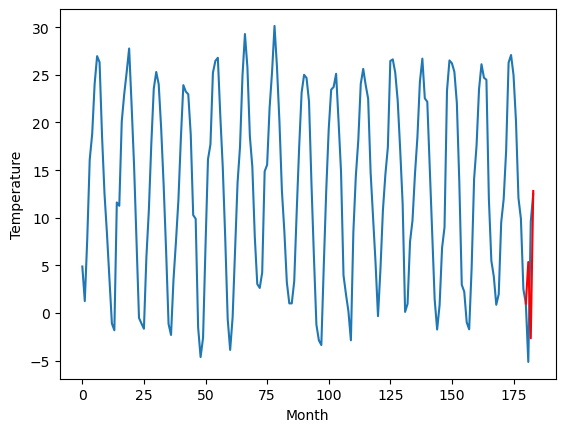

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.34		3.68		-4.66
11.77		-4.32		-16.09
13.37		11.13		-2.24
[180, 181, 182, 183]
[14.25, 3.681727542877197, -4.320381984710694, 11.131520404815674]


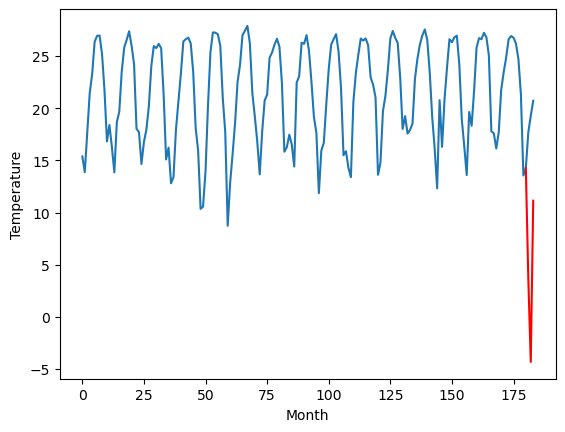

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		0.30		-3.99
2.37		-7.70		-10.07
11.70		7.75		-3.95
[180, 181, 182, 183]
[9.06, 0.30172754287719705, -7.700381984710694, 7.751520404815674]


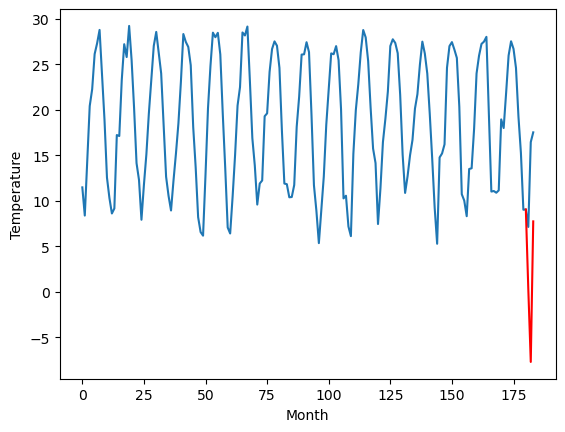

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.70		-0.34		-3.04
-0.76		-8.34		-7.58
10.20		7.11		-3.09
[180, 181, 182, 183]
[7.48, -0.33827245712280263, -8.340381984710692, 7.111520404815675]


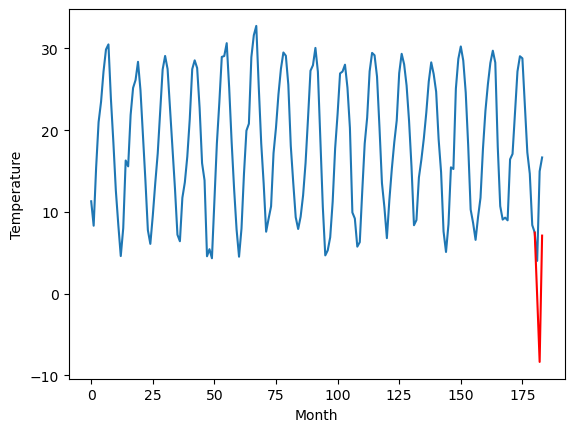

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		0.93		-3.36
0.40		-7.07		-7.47
11.32		8.38		-2.94
[180, 181, 182, 183]
[7.33, 0.931727542877197, -7.070381984710694, 8.381520404815674]


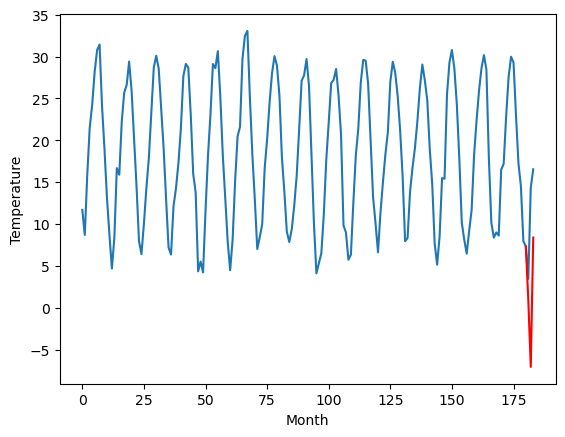

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.28		11.42		-2.86
12.71		3.42		-9.29
21.96		18.87		-3.09
[180, 181, 182, 183]
[6.59, 11.421727542877198, 3.4196180152893074, 18.871520404815676]


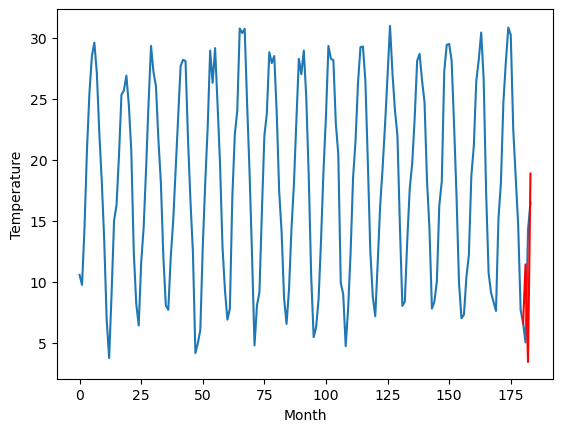

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.72		7.53		-4.19
12.39		-0.47		-12.86
18.79		14.98		-3.81
[180, 181, 182, 183]
[6.04, 7.5317275428771975, -0.47038198471069315, 14.981520404815674]


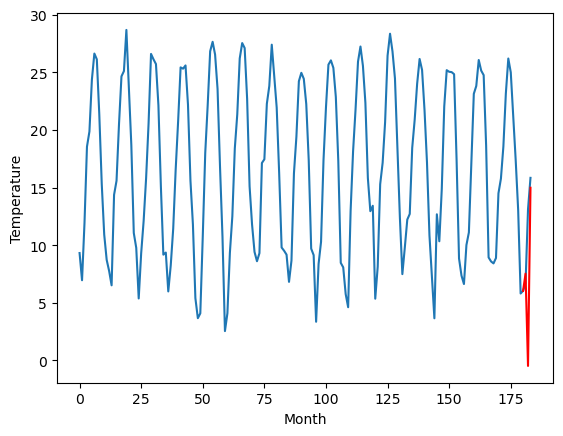

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.64		7.35		-2.29
6.03		-0.65		-6.68
18.30		14.80		-3.50
[180, 181, 182, 183]
[3.13, 7.351727542877198, -0.6503819847106929, 14.801520404815674]


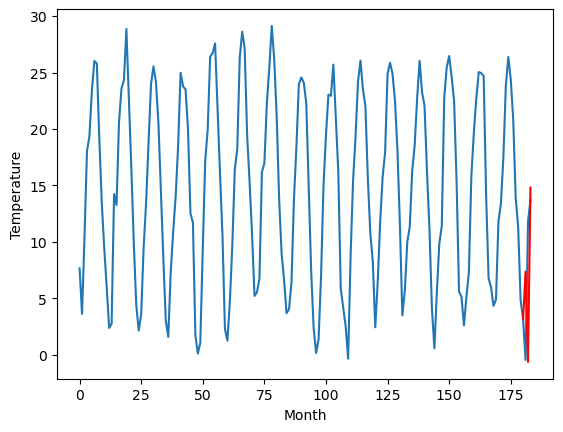

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.11		7.73		-2.38
6.75		-0.27		-7.02
18.72		15.18		-3.54
[180, 181, 182, 183]
[-0.29, 7.731727542877197, -0.27038198471069386, 15.181520404815673]


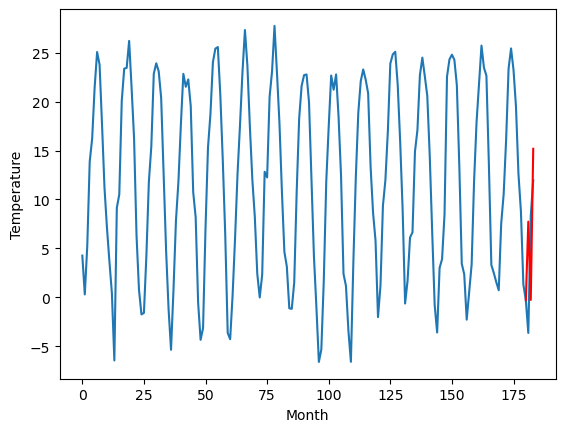

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		6.60		-1.93
4.09		-1.40		-5.49
17.95		14.05		-3.90
[180, 181, 182, 183]
[-1.03, 6.601727542877198, -1.4003819847106929, 14.051520404815674]


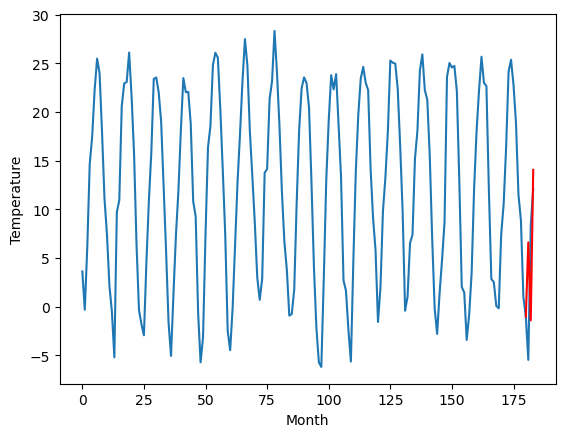

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.40		5.36		-2.04
5.16		-2.64		-7.80
15.05		12.81		-2.24
[180, 181, 182, 183]
[-2.29, 5.3617275428771975, -2.640381984710693, 12.811520404815674]


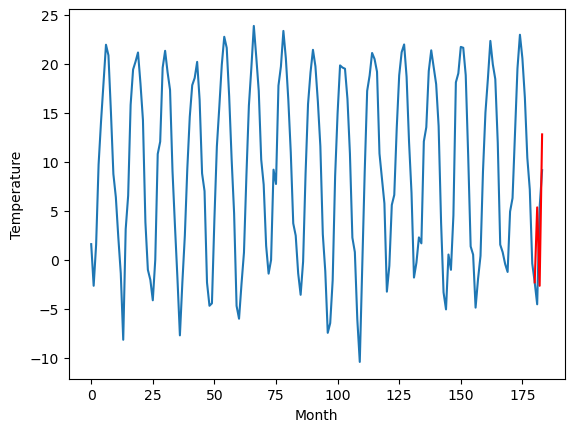

RangeIndex(start=1, stop=12, step=1)
[7.810000000000001, 8.339999999999998, 4.290000000000002, 2.7000000000000006, 4.289999999999999, 14.280000000000001, 11.719999999999999, 9.64, 10.11, 8.53, 7.4]
[5.3617275428771975, 3.681727542877197, 0.30172754287719705, -0.33827245712280263, 0.931727542877197, 11.421727542877198, 7.5317275428771975, 7.351727542877198, 7.731727542877197, 6.601727542877198, 5.3617275428771975]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.81   5.361728
1                 1    8.34   3.681728
2                 2    4.29   0.301728
3                 3    2.70  -0.338272
4                 4    4.29   0.931728
5                 5   14.28  11.421728
6                 6   11.72   7.531728
7                 7    9.64   7.351728
8                 8   10.11   7.731728
9                 9    8.53   6.601728
10               10    7.40   5.361728


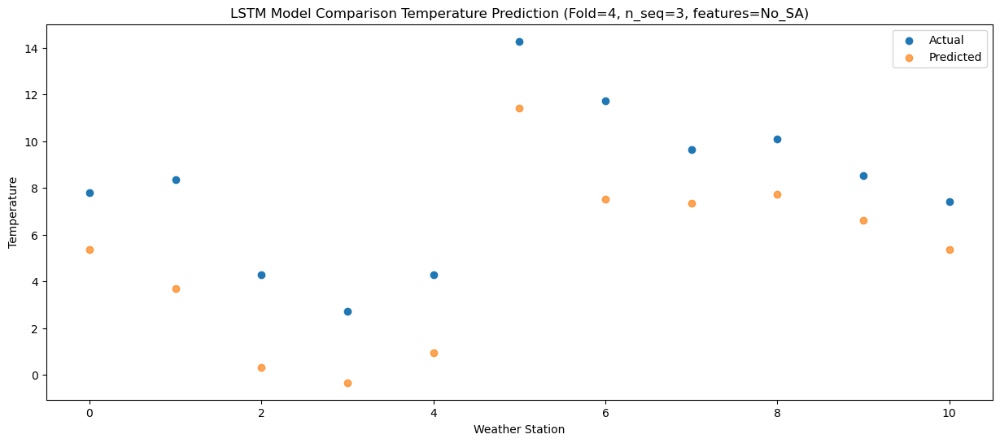

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.68  -2.640382
1                 1   11.77  -4.320382
2                 2    2.37  -7.700382
3                 3   -0.76  -8.340382
4                 4    0.40  -7.070382
5                 5   12.71   3.419618
6                 6   12.39  -0.470382
7                 7    6.03  -0.650382
8                 8    6.75  -0.270382
9                 9    4.09  -1.400382
10               10    5.16  -2.640382


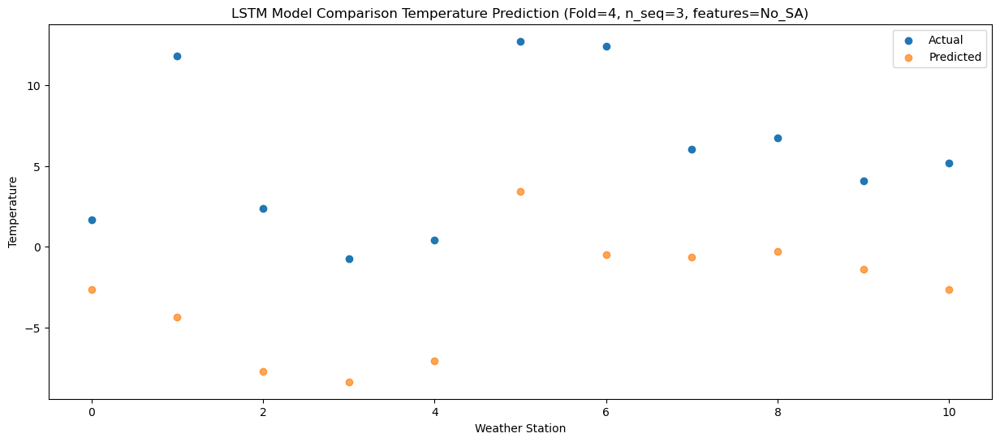

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.41   12.81152
1                 1   13.37   11.13152
2                 2   11.70    7.75152
3                 3   10.20    7.11152
4                 4   11.32    8.38152
5                 5   21.96   18.87152
6                 6   18.79   14.98152
7                 7   18.30   14.80152
8                 8   18.72   15.18152
9                 9   17.95   14.05152
10               10   15.05   12.81152


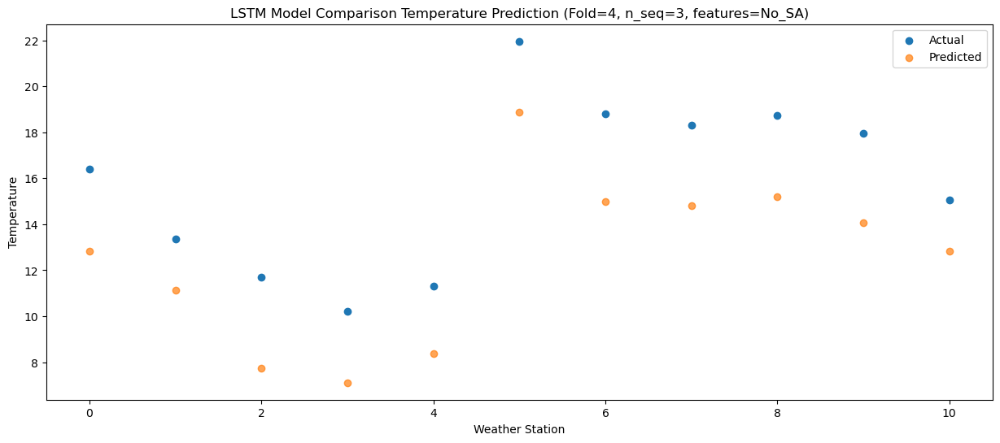

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (1, 1, 1024)              12263424  
                                                                 
 dropout_8 (Dropout)         (1, 1, 1024)              0         
                                                                 
 lstm_9 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_9 (Dropout)         (1, 1024)                 0         
                                                                 
 dense_12 (Dense)            (1, 256)                  262400    
                                                                 
 dense_13 (Dense)            (1, 128)                  32896     
                                                                 
 dense_14 (Dense)            (1, 3)                   

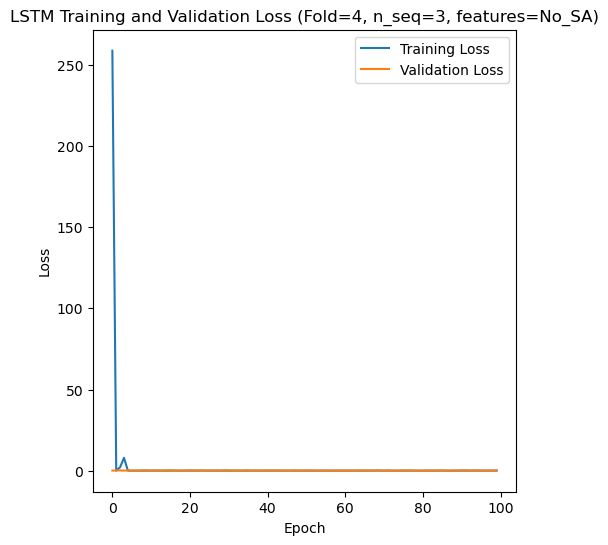

[[2.1455511474162, 2.69753533265236, 1.0991896076478087], [0.7132109418483816, 10.19690793317133, 6.221729538038347], [1.071539039208498, 2.985129234296094, 3.3111198008564555], [1.321800252089704, 6.851847205849138, 3.3670801665887375], [3.1418792658398793, 9.1891815175641, 3.31300550670691]]
[[1.9756178170984442, 2.241150055798617, 0.8717412471771255], [0.6146331921490753, 9.996786632104355, 6.132091665701434], [0.862207324721597, 2.534096205451272, 2.0431690640883007], [1.107806607159701, 6.106798830032349, 2.651053884679621], [3.0155451843955303, 8.60674562107433, 3.262115958820689]]
[[0.21311447074264853, 0.40648540122212073, 0.0529251498944429], [0.0698474120138859, 1.1608095271891943, 0.36368325377129535], [0.12530583551640823, 0.33350357790920565, 0.16809275758700343], [0.22679484767919733, 2.9721987019650835, 0.4135325573240888], [0.47649317889865267, 3.96444495384069, 0.2160007062491509]]
[[0.26388904133451185, 0.33708774565957533, 0.8386401797268231], [0.9222477534797124, -3

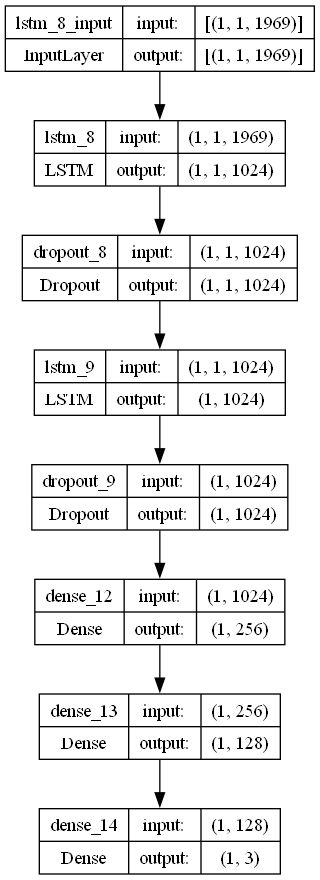

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from best model
    lr =  0.30861173110805173
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.44613235732750156

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with an LSTM,
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S3_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

In [3]:
import tensorflow as tf
import numpy as np
from numpy import array
import keras.backend as K

def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))

actual_results = [[[10.147435998916626, 7.894216871261596, 14.803615427017212], [9.167435998916627, 6.914216871261598, 13.823615427017213], [7.787435998916626, 5.534216871261597, 12.443615427017212], [6.587435998916626, 4.334216871261597, 11.243615427017211], [13.507435998916627, 11.254216871261598, 18.163615427017213], [15.817435998916626, 13.564216871261596, 20.47361542701721], [10.207435998916626, 7.954216871261597, 14.863615427017212], [15.527435998916626, 13.274216871261597, 20.183615427017212], [14.597435998916627, 12.344216871261597, 19.253615427017213], [12.087435998916625, 9.834216871261596, 16.74361542701721], [10.147435998916626, 7.894216871261596, 14.803615427017212]], [[8.601290698051452, -2.4622411775588997, 9.513362879753112], [7.171290698051453, -3.8922411775588985, 8.083362879753114], [8.411290698051452, -2.652241177558899, 9.323362879753113], [7.441290698051453, -3.622241177558899, 8.353362879753114], [11.681290698051452, 0.6177588224411004, 12.593362879753112], [7.831290698051452, -3.2322411775588993, 8.743362879753112], [10.301290698051453, -0.7622411775588986, 11.213362879753113], [14.191290698051453, 3.127758822441102, 15.103362879753114], [12.901290698051453, 1.837758822441101, 13.813362879753113], [12.431290698051452, 1.3677588224411004, 13.343362879753112], [8.601290698051452, -2.4622411775588997, 9.513362879753112]], [[11.403968825340272, 10.104941740036011, 19.316408529281617], [6.033968825340271, 4.73494174003601, 13.946408529281616], [11.30396882534027, 10.00494174003601, 19.216408529281615], [7.833968825340271, 6.534941740036011, 15.746408529281616], [7.87396882534027, 6.57494174003601, 15.786408529281616], [5.543968825340271, 4.244941740036011, 13.456408529281617], [17.08396882534027, 15.784941740036011, 24.996408529281616], [1.9439688253402712, 0.6449417400360109, 9.856408529281616], [13.20396882534027, 11.90494174003601, 21.116408529281614], [13.313968825340272, 12.014941740036011, 21.226408529281617], [11.403968825340272, 10.104941740036011, 19.316408529281617]], [[-9.184127321243286, -3.3232011699676516, -0.3171279335021975], [8.625872678756714, 14.486798830032349, 17.492872066497803], [8.095872678756713, 13.956798830032348, 16.962872066497802], [2.255872678756714, 8.116798830032348, 11.122872066497802], [7.955872678756714, 13.816798830032349, 16.8228720664978], [6.075872678756713, 11.936798830032348, 14.942872066497802], [6.705872678756714, 12.566798830032349, 15.572872066497803], [5.625872678756714, 11.486798830032349, 14.492872066497803], [3.305872678756714, 9.166798830032349, 12.172872066497803], [4.385872678756714, 10.246798830032349, 13.252872066497803], [-9.184127321243286, -3.3232011699676516, -0.3171279335021975]], [[5.3617275428771975, -2.640381984710693, 12.811520404815674], [3.681727542877197, -4.320381984710694, 11.131520404815674], [0.30172754287719705, -7.700381984710694, 7.751520404815674], [-0.33827245712280263, -8.340381984710692, 7.111520404815675], [0.931727542877197, -7.070381984710694, 8.381520404815674], [11.421727542877198, 3.4196180152893074, 18.871520404815676], [7.5317275428771975, -0.47038198471069315, 14.981520404815674], [7.351727542877198, -0.6503819847106929, 14.801520404815674], [7.731727542877197, -0.27038198471069386, 15.181520404815673], [6.601727542877198, -1.4003819847106929, 14.051520404815674], [5.3617275428771975, -2.640381984710693, 12.811520404815674]]]
forecast_results = [[[7.989999999999999, 4.639999999999997, 15.71], [8.53, 8.44, 13.499999999999996], [7.310000000000001, 8.170000000000002, 14.150000000000002], [5.3800000000000034, 3.810000000000003, 11.720000000000004], [11.33, 8.24, 18.139999999999997], [12.739999999999998, 13.389999999999997, 18.29], [8.33, 8.970000000000002, 15.950000000000003], [13.29, 13.91, 20.43], [12.51, 8.24, 20.71], [9.2, 7.029999999999999, 17.78], [7.24, 2.9300000000000015, 14.660000000000004]], [[9.54, 9.760000000000002, 14.74], [7.489999999999999, 8.149999999999999, 14.92], [9.35, 9.840000000000002, 16.900000000000006], [7.859999999999999, 6.2700000000000005, 13.64], [12.189999999999998, 10.489999999999998, 18.1], [6.84, 7.22, 14.560000000000002], [10.62, 11.4, 17.68], [14.4, 11.4, 22.72], [13.07, 8.29, 20.85], [13.06, 8.690000000000001, 19.4], [7.279999999999999, 6.32, 13.54]], [[11.88, 7.48, 19.9], [6.69, 2.6500000000000004, 12.840000000000002], [12.7, 15.43, 17.24], [5.490000000000001, 5.5100000000000025, 9.620000000000001], [8.96, 8.22, 15.55], [5.69, 3.339999999999999, 11.719999999999999], [17.12, 14.010000000000002, 24.380000000000003], [3.2200000000000015, 6.140000000000003, 9.240000000000004], [13.880000000000003, 12.960000000000003, 12.560000000000002], [13.64, 14.139999999999999, 21.019999999999996], [12.47, 13.820000000000002, 20.030000000000005]], [[-8.520000000000001, -8.15, -1.3500000000000005], [8.420000000000002, 4.700000000000002, 16.67], [10.299999999999999, 12.599999999999998, 13.749999999999996], [1.7399999999999998, 0.41999999999999904, 10.629999999999999], [7.430000000000001, 3.5599999999999996, 16.639999999999997], [5.5699999999999985, 2.8499999999999983, 14.179999999999998], [7.92, 8.020000000000001, 10.99], [7.119999999999999, 9.969999999999999, 11.569999999999999], [5.4700000000000015, 6.400000000000002, 6.180000000000004], [2.3099999999999996, 2.189999999999999, 7.189999999999998], [-9.8, -10.600000000000001, -3.410000000000002]], [[7.810000000000001, 1.6800000000000015, 16.41], [8.339999999999998, 11.77, 13.370000000000001], [4.290000000000002, 2.37, 11.7], [2.7000000000000006, -0.7600000000000002, 10.199999999999998], [4.289999999999999, 0.3999999999999999, 11.320000000000002], [14.280000000000001, 12.71, 21.96], [11.719999999999999, 12.389999999999999, 18.79], [9.64, 6.030000000000001, 18.3], [10.11, 6.75, 18.72], [8.53, 4.09, 17.950000000000003], [7.4, 5.16, 15.05]]]
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Average PEARSON:"+str(p1))

[10.147436    7.89421687 14.80361543  9.167436    6.91421687 13.82361543
  7.787436    5.53421687 12.44361543  6.587436    4.33421687 11.24361543
 13.507436   11.25421687 18.16361543 15.817436   13.56421687 20.47361543
 10.207436    7.95421687 14.86361543 15.527436   13.27421687 20.18361543
 14.597436   12.34421687 19.25361543 12.087436    9.83421687 16.74361543
 10.147436    7.89421687 14.80361543  8.6012907  -2.46224118  9.51336288
  7.1712907  -3.89224118  8.08336288  8.4112907  -2.65224118  9.32336288
  7.4412907  -3.62224118  8.35336288 11.6812907   0.61775882 12.59336288
  7.8312907  -3.23224118  8.74336288 10.3012907  -0.76224118 11.21336288
 14.1912907   3.12775882 15.10336288 12.9012907   1.83775882 13.81336288
 12.4312907   1.36775882 13.34336288  8.6012907  -2.46224118  9.51336288
 11.40396883 10.10494174 19.31640853  6.03396883  4.73494174 13.94640853
 11.30396883 10.00494174 19.21640853  7.83396883  6.53494174 15.74640853
  7.87396883  6.57494174 15.78640853  5.54396883  4